# Import Required Libraries

In [1]:
#Supress any Warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
!pip install xgboost
!pip install plotly
!pip install six
!pip install pydotplus
!pip install graphviz

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
import plotly.graph_objs as go

import plotly.offline as py
py.init_notebook_mode(connected=True)

# Load Data

In [4]:
df=pd.read_csv("train.csv")

In [5]:
df.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,...,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,...,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,...,0,0,NaN,1.0,NaN,710,0.0,0.0,0.0,0
2,2,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,60.806,103.176,...,0,0,NaN,NaN,NaN,882,0.0,0.0,0.0,0
3,3,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,156.362,205.260,...,0,0,NaN,NaN,NaN,982,0.0,0.0,0.0,0
4,4,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,240.708,128.191,...,1,0,1.0,1.0,1.0,647,0.0,0.0,0.0,0


# Data Cleanup

### Column Cleanup

In [6]:
#Fill dates in date column
df.loc[df['last_date_of_month_6'].isna(),'last_date_of_month_6']=df.last_date_of_month_6.mode()
df.loc[df['last_date_of_month_7'].isna(),'last_date_of_month_7']=df.last_date_of_month_6.mode()
df.loc[df['last_date_of_month_8'].isna(),'last_date_of_month_8']=df.last_date_of_month_6.mode()

df.loc[df['date_of_last_rech_6'].isna(),'date_of_last_rech_6']=df.last_date_of_month_6.mode()
df.loc[df['date_of_last_rech_7'].isna(),'date_of_last_rech_7']=df.last_date_of_month_7.mode()
df.loc[df['date_of_last_rech_8'].isna(),'date_of_last_rech_8']=df.last_date_of_month_8.mode()

In [7]:
#Derive data from date columns
df['last_rech_days_left_6']=(pd.to_datetime(df.last_date_of_month_6)-pd.to_datetime(df.date_of_last_rech_6)).dt.days
df['last_rech_days_left_7']=(pd.to_datetime(df.last_date_of_month_7)-pd.to_datetime(df.date_of_last_rech_7)).dt.days
df['last_rech_days_left_8']=(pd.to_datetime(df.last_date_of_month_8)-pd.to_datetime(df.date_of_last_rech_8)).dt.days

In [8]:
#Drop all columns having more than 50% null values
cols_to_drop = []
for col in df.columns :
    max_pct = df[col].isna().sum()*100/len(df)
    if (max_pct > 50) :
        cols_to_drop.append(col)
        
df.drop(cols_to_drop, axis=1, inplace=True)
print(df.shape)
print(cols_to_drop)

(69999, 145)
['date_of_last_rech_data_6', 'date_of_last_rech_data_7', 'date_of_last_rech_data_8', 'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8', 'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8', 'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8', 'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8', 'fb_user_6', 'fb_user_7', 'fb_user_8']


In [9]:
#Drop all columns having more than 75% same values
cols_to_drop = []
for col in df.columns :
    max_pct = np.max(df[col].value_counts(normalize=True) * 100)
    if (max_pct > 75 and col!="churn_probability") :
        cols_to_drop.append(col)
        
df.drop(cols_to_drop, axis=1, inplace=True)
print(df.shape)
print(cols_to_drop)

(69999, 81)
['circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'std_ic_t2f_mou_6', 'std_ic_t2f_mou_7', 'std_ic_t2f_mou_8', 'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8', 'spl_ic_mou_6', 'spl_ic_mou_7', 'spl_ic_mou_8', 'isd_ic_mou_6', 'isd_ic_mou_7', 'isd_ic_mou_8', 'ic_others_6', 'ic_others_7', 'ic_others_8', 'vol_2g_mb_6', 'vol_2g_mb_7', 'vol_2g_mb_8', 'vol_3g_mb_6', 'vol_3g_mb_7', 'vol_3g_mb_8', 'monthly_2g_6', 'monthly_2g_7', 'monthly_2g_8', 'sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8', 'monthly_3g_6', 'monthly_3g_7

In [10]:
#Drop all irrelevant columns
df=df.drop(['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8'],axis=1)
df.shape

(69999, 78)

In [11]:
#Check all null values
df[df.columns[df.isna().any()]].isna().sum()

onnet_mou_6              2768
onnet_mou_7              2687
onnet_mou_8              3703
offnet_mou_6             2768
offnet_mou_7             2687
offnet_mou_8             3703
loc_og_t2t_mou_6         2768
loc_og_t2t_mou_7         2687
loc_og_t2t_mou_8         3703
loc_og_t2m_mou_6         2768
loc_og_t2m_mou_7         2687
loc_og_t2m_mou_8         3703
loc_og_t2f_mou_6         2768
loc_og_t2f_mou_7         2687
loc_og_t2f_mou_8         3703
loc_og_mou_6             2768
loc_og_mou_7             2687
loc_og_mou_8             3703
std_og_t2t_mou_6         2768
std_og_t2t_mou_7         2687
std_og_t2t_mou_8         3703
std_og_t2m_mou_6         2768
std_og_t2m_mou_7         2687
std_og_t2m_mou_8         3703
std_og_mou_6             2768
std_og_mou_7             2687
std_og_mou_8             3703
spl_og_mou_6             2768
spl_og_mou_7             2687
spl_og_mou_8             3703
loc_ic_t2t_mou_6         2768
loc_ic_t2t_mou_7         2687
loc_ic_t2t_mou_8         3703
loc_ic_t2m

In [12]:
#fill all null values with 0 as it implicates that user was not using its service at that month
df=df.fillna(0)
    
#Recheck all null values
df[df.columns[df.isna().any()]].isna().sum()

Series([], dtype: float64)

In [13]:
dftypes=df.select_dtypes(exclude=[np.float64,np.number])
dftypes.dtypes

Series([], dtype: object)

In [14]:
filter_col = [col.replace('_6','') for col in df if col.endswith('_6')]
der_cols_to_drop=[]

for col in filter_col:
    der_cols_to_drop.append(col)
    df[col]=df[col+'_6']+df[col+'_7']+df[col+'_8']
    
df.head()

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,...,loc_ic_mou,std_ic_t2t_mou,std_ic_t2m_mou,std_ic_mou,total_ic_mou,total_rech_num,total_rech_amt,max_rech_amt,last_day_rch_amt,last_rech_days_left
0,0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,...,52.73,7.82,42.38,50.22,105.44,7,152,140,130,36.0
1,1,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,...,67.91,0.00,0.00,0.00,67.92,12,195,195,0,44.0
2,2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,...,155.73,11.69,27.07,38.77,194.76,8,190,140,120,35.0
3,3,156.362,205.260,111.095,7.26,16.01,0.00,68.76,78.48,50.23,...,217.13,0.00,11.98,11.98,229.13,9,530,270,270,31.0
4,4,240.708,128.191,101.565,21.28,4.83,6.13,56.99,38.11,9.63,...,59.21,0.00,0.00,0.00,59.21,31,548,121,65,11.0


### Row Cleanup 

In [15]:
df.describe()

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,...,loc_ic_mou,std_ic_t2t_mou,std_ic_t2m_mou,std_ic_mou,total_ic_mou,total_rech_num,total_rech_amt,max_rech_amt,last_day_rch_amt,last_rech_days_left
count,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,...,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000
mean,34999.000000,283.134365,278.185912,278.858826,127.887939,128.754731,125.943607,191.010582,189.585401,186.146273,...,479.473089,27.982627,60.741285,94.873071,600.074703,22.498121,974.362505,316.247189,185.210646,16.539551
std,20207.115084,334.213918,344.366927,351.924315,295.115497,306.326345,304.990552,312.900706,318.492632,318.453812,...,689.350723,137.256815,215.150697,284.739053,802.823888,18.532104,1106.099526,299.610206,218.944632,12.295120
min,0.000000,-2258.709000,-1289.715000,-945.808000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,17499.500000,93.581000,86.714000,84.095000,5.430000,4.910000,4.110000,28.790000,26.690000,23.780000,...,100.960000,0.000000,0.780000,3.640000,152.260000,11.000000,360.000000,130.000000,55.000000,7.000000
50%,34999.000000,197.484000,191.588000,192.234000,30.830000,29.160000,27.840000,89.810000,85.590000,83.010000,...,273.600000,1.400000,11.450000,23.850000,364.050000,17.000000,692.000000,256.000000,126.000000,14.000000
75%,52498.500000,370.791000,365.369500,369.909000,113.100000,108.940000,106.280000,223.540000,218.350000,216.410000,...,596.070000,16.195000,48.800000,83.715000,746.695000,28.000000,1244.000000,386.000000,252.000000,24.000000
max,69998.000000,27731.088000,35145.834000,33543.624000,7376.710000,8157.780000,10752.560000,8362.360000,7043.980000,14007.340000,...,21397.880000,9575.620000,15926.880000,16076.840000,21486.180000,366.000000,120845.000000,9997.000000,8966.000000,85.000000


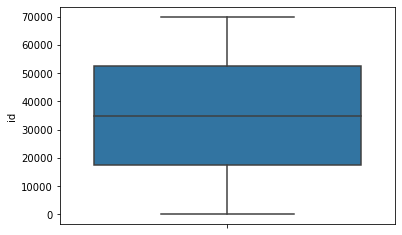

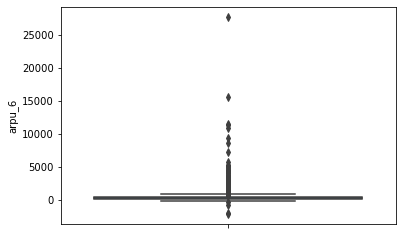

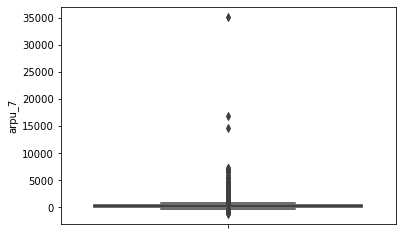

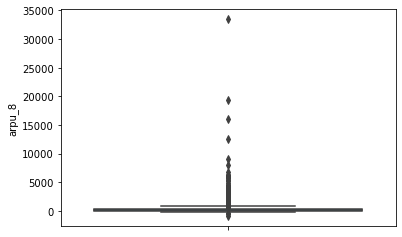

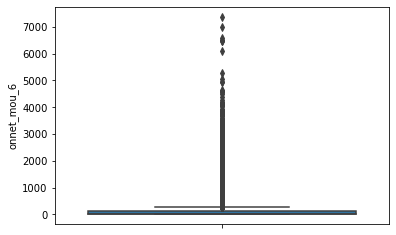

...

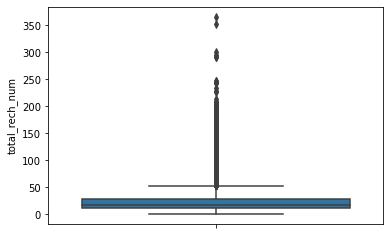

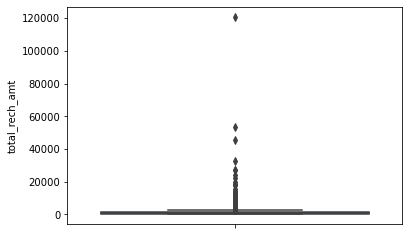

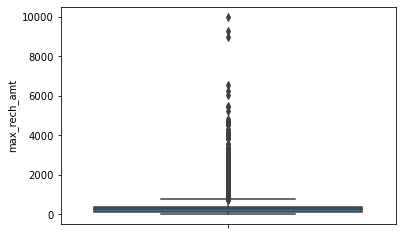

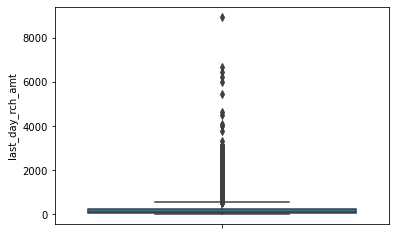

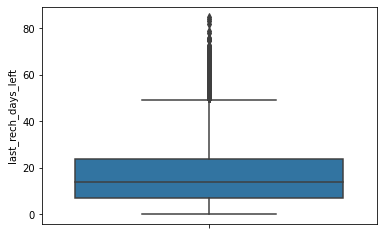

In [16]:
#Plotting all numerical values box plot
for col in df:
    plt.figure()
    sns.boxplot(y=df[col])
    plt.show()

In [17]:
#Removing outliers from all continuous variables
new_df=df
for col in df:
    if col!="churn_probability":
        p25=df[col].quantile(0.25)
        p75=df[col].quantile(0.75)
        iqr=p75-p25
        ul=p75+1.5*iqr
        ll=p25-1.5*iqr
        new_df=new_df[(df[col]>=ll) & (df[col]<=ul)]
    
df=new_df
print(df.shape)
df.describe()

(8782, 103)


,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,...,loc_ic_mou,std_ic_t2t_mou,std_ic_t2m_mou,std_ic_mou,total_ic_mou,total_rech_num,total_rech_amt,max_rech_amt,last_day_rch_amt,last_rech_days_left
count,8782.000000,8782.000000,8782.000000,8782.000000,8782.000000,8782.000000,8782.000000,8782.000000,8782.000000,8782.000000,...,8782.000000,8782.000000,8782.000000,8782.000000,8782.000000,8782.000000,8782.000000,8782.000000,8782.000000,8782.000000
mean,35251.401503,123.393501,114.004376,118.001102,15.159407,13.475194,13.550420,47.746042,42.957982,44.239459,...,176.268443,0.852857,6.351533,8.632512,191.033212,14.870075,405.201890,203.563653,111.697905,17.368139
std,20284.157418,102.565668,99.340918,103.712709,23.703406,21.062259,21.098073,54.418897,50.219955,51.908300,...,173.995216,2.303940,12.381705,14.993235,183.664435,8.013034,278.290009,151.454210,109.364734,9.406090
min,6.000000,-57.200000,-68.498000,-43.769000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,17709.000000,52.464000,45.055250,44.071000,0.000000,0.000000,0.000000,4.130000,3.315000,2.610000,...,30.995000,0.000000,0.000000,0.000000,40.582500,9.000000,210.000000,90.000000,35.000000,10.000000
50%,35479.000000,101.526500,90.062000,95.914500,5.430000,4.870000,4.435000,30.940000,26.610000,26.560000,...,129.560000,0.000000,0.430000,1.710000,143.430000,13.000000,330.000000,150.000000,78.000000,16.000000
75%,53294.500000,167.873750,156.769500,166.362500,20.530000,18.375000,18.990000,71.940000,63.360000,65.920000,...,270.545000,0.150000,6.625000,10.470000,289.065000,18.000000,525.000000,278.000000,150.000000,24.000000
max,69998.000000,777.000000,743.926000,796.471000,258.040000,242.660000,255.530000,484.210000,464.740000,410.790000,...,1008.230000,22.070000,95.550000,173.080000,1380.520000,53.000000,2310.000000,756.000000,545.000000,49.000000


In [18]:
cols = [col for col in df if col.endswith('_mou')]
df=df.loc[~(df[cols]==0).all(axis=1)]
df=df[df['total_rech_amt']!=0]
print(df.shape)

(8313, 103)


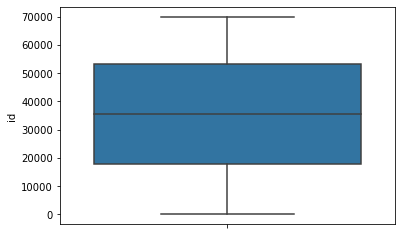

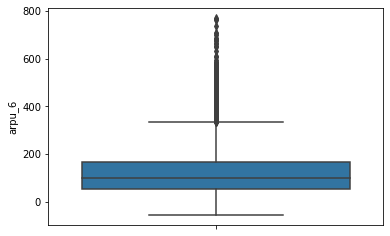

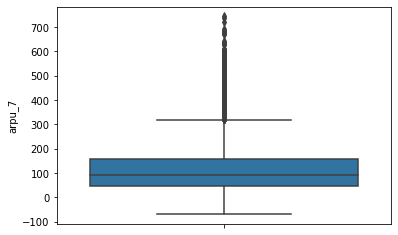

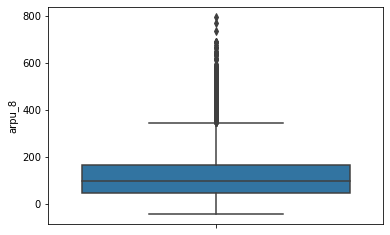

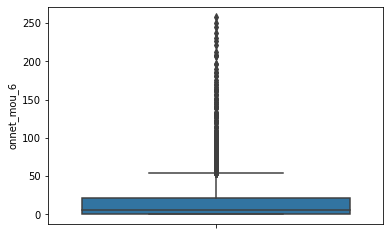

...

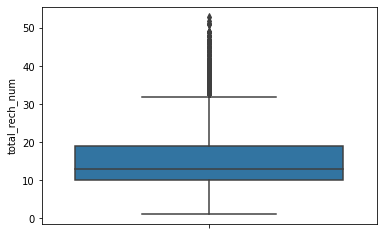

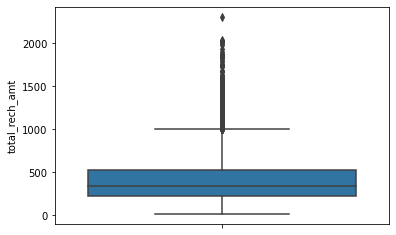

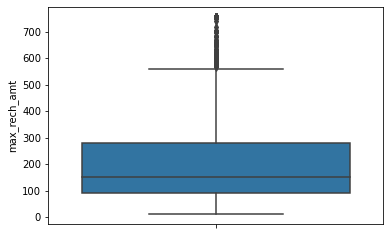

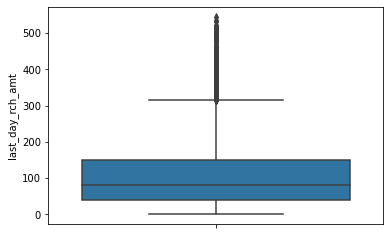

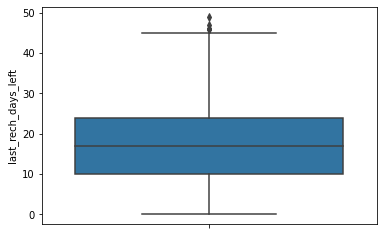

In [19]:
#Plotting all numerical values box plot
for col in df:
    plt.figure()
    sns.boxplot(y=df[col])
    plt.show()

##### Data Type Conversion is not required

# Data Analysis and Exploration

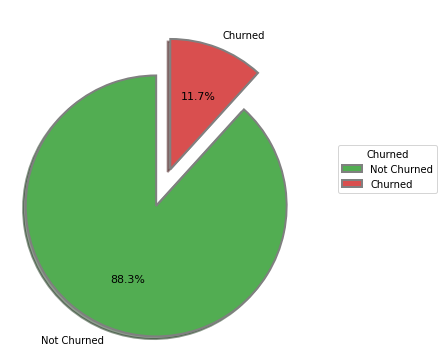

In [20]:
# Import libraries
import numpy as np
import matplotlib.pyplot as plt

# Creating dataset
churn = ['Not Churned', 'Churned']
data = df.churn_probability.value_counts()
# Creating explode data
explode = (0.3, 0.0)
# Creating color parameters
colors = ( "#52ad52", "#d94f4f")
# Wedge properties
wp = { 'linewidth' : 2, 'edgecolor' : "grey" }
# Creating autocpt arguments
def func(pct, allvalues):
    return "{:.1f}%".format(pct)

# Creating plot
fig, ax = plt.subplots(figsize =(6, 6))
wedges, texts, autotexts = ax.pie(data,autopct = lambda pct: func(pct, data),explode = explode,labels = churn,shadow = True,
                                  colors = colors,startangle = 90,wedgeprops = wp,textprops = dict(color ="black"))

# Adding legend
ax.legend(wedges, churn,title ="Churned",loc ="center left",bbox_to_anchor =(1, 0, 0.5, 1))

plt.setp(autotexts, size = 11)

# show plot
plt.show()

In [21]:
#Creating necessary bins
df['arpu_bins'] = pd.cut(x=df.loc[:,'arpu'], bins=[0, 200, 300, 600, 2200],
                             labels=['0 to 200', '201 to 300', '301 to 600', 'More than 600'], include_lowest=True)
df['onnet_bins'] = pd.cut(x=df.loc[:,'onnet_mou'], bins=[0, 10, 40, 100, 1000],
                             labels=['0 to 10', '11 to 40', '41 to 100', 'More than 100'], include_lowest=True)
df['offnet_bins'] = pd.cut(x=df.loc[:,'offnet_mou'], bins=[0, 60, 140, 270, 1500],
                             labels=['0 to 60', '61 to 140', '141 to 270', 'More than 270'], include_lowest=True)

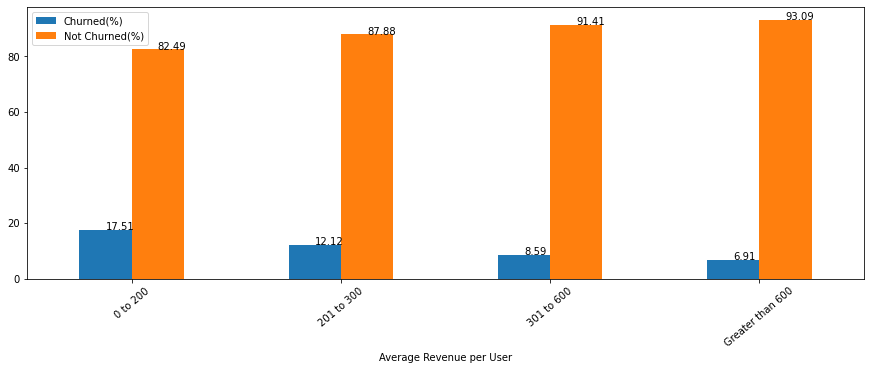

In [22]:
# Relation between avg revenue per user vs churned user
data=[['0 to 200',0,0], ['201 to 300',0,0], ['301 to 600',0,0], ['Greater than 600',0,0]]
df_per_arpu = pd.DataFrame(data, columns = ['arpu_bins', 'Churned','Not Churned'])
df_per_arpu['Churned']=df[df.churn_probability==1].groupby(['arpu_bins'],as_index=False)["id"].count()['id']
df_per_arpu['Not Churned']=df[df.churn_probability==0].groupby(['arpu_bins'],as_index=False)["id"].count()['id']

df_per_arpu['Churned(%)']=df_per_arpu['Churned']*100/(df_per_arpu['Churned']+df_per_arpu['Not Churned'])
df_per_arpu['Not Churned(%)']=df_per_arpu['Not Churned']*100/(df_per_arpu['Churned']+df_per_arpu['Not Churned'])

fig, ax = plt.subplots()
fig.set_figheight(5)
fig.set_figwidth(15)
df_per_arpu.plot.bar(x = 'arpu_bins', y = ['Churned(%)', 'Not Churned(%)'], rot = 40, ax = ax)
ax.set_xlabel('Average Revenue per User')
for p in ax.patches: 
    ax.annotate(np.round(p.get_height(),decimals=2), (p.get_x()+p.get_width()/2., p.get_height()))
    
## Conslusion: Using bins, we found that as the Avg revenue increases churned users decreases linearly

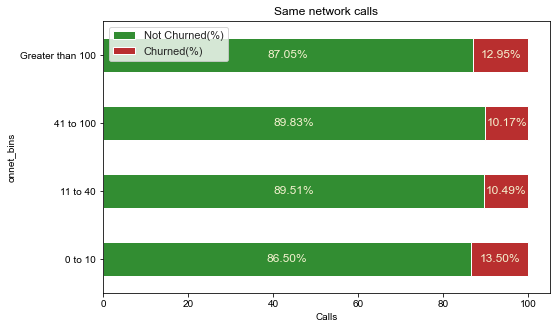

In [23]:
# Relation between Same network calls by user vs churned user
data=[['0 to 10',0,0], ['11 to 40',0,0], ['41 to 100',0,0], ['Greater than 100',0,0]]
df_per_onnet = pd.DataFrame(data, columns = ['onnet_bins', 'Churned','Not Churned'])
df_per_onnet['Churned']=df[df.churn_probability==1].groupby(['onnet_bins'],as_index=False)["id"].count()['id']
df_per_onnet['Not Churned']=df[df.churn_probability==0].groupby(['onnet_bins'],as_index=False)["id"].count()['id']

df_per_onnet['Not Churned(%)']=df_per_onnet['Not Churned']*100/(df_per_onnet['Churned']+df_per_onnet['Not Churned'])
df_per_onnet['Churned(%)']=df_per_onnet['Churned']*100/(df_per_onnet['Churned']+df_per_onnet['Not Churned'])

df_per_onnet.drop(['Churned','Not Churned'],axis=1, inplace=True)

fig, ax = plt.subplots()
fig.set_figheight(5)
fig.set_figwidth(8)

#set seaborn plotting aesthetics
sns.set(style='white')

#create stacked bar chart
df_per_onnet.set_index('onnet_bins').plot(kind='barh', stacked=True, color=["#328d32", "#b92f2f"], ax = ax)
ax.set_xlabel('Same network calls')

for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.text(x+width/2,y+height/2,'{:.2f}%'.format(p.get_width()),horizontalalignment='center',verticalalignment='center',
            color='#f5f2d0',fontsize=12)
    
plt.title('Same network calls', fontsize=12)
plt.xlabel('Calls')
plt.show()
## Conslusion: Using bins, we found that as the Other network calls increases churned users decreases then increases

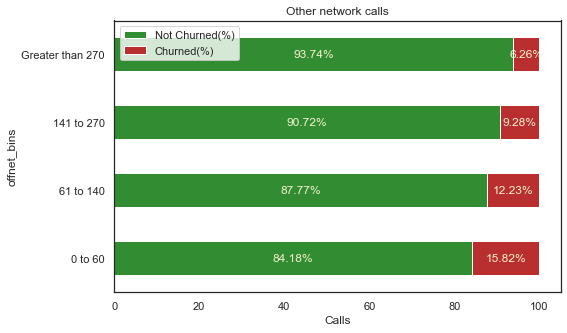

In [24]:
# Relation between Other network calls by user vs churned user
data=[['0 to 60',0,0], ['61 to 140',0,0], ['141 to 270',0,0], ['Greater than 270',0,0]]
df_per_offnet = pd.DataFrame(data, columns = ['offnet_bins', 'Churned','Not Churned'])
df_per_offnet['Churned']=df[df.churn_probability==1].groupby(['offnet_bins'],as_index=False)["id"].count()['id']
df_per_offnet['Not Churned']=df[df.churn_probability==0].groupby(['offnet_bins'],as_index=False)["id"].count()['id']

df_per_offnet['Not Churned(%)']=df_per_offnet['Not Churned']*100/(df_per_offnet['Churned']+df_per_offnet['Not Churned'])
df_per_offnet['Churned(%)']=df_per_offnet['Churned']*100/(df_per_offnet['Churned']+df_per_offnet['Not Churned'])

df_per_offnet.drop(['Churned','Not Churned'],axis=1, inplace=True)

fig, ax = plt.subplots()
fig.set_figheight(5)
fig.set_figwidth(8)

#set seaborn plotting aesthetics
sns.set(style='white')

#create stacked bar chart
df_per_offnet.set_index('offnet_bins').plot(kind='barh', stacked=True, color=["#328d32", "#b92f2f"], ax = ax)
ax.set_xlabel('Other network calls')

for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.text(x+width/2,y+height/2,'{:.2f}%'.format(p.get_width()),horizontalalignment='center',verticalalignment='center',
            color='#f5f2d0',fontsize=12)
    
plt.title('Other network calls', fontsize=12)
plt.xlabel('Calls')
plt.show()
## Conslusion: Using bins, we found that as the Other network calls increases churned users decreases linearly

We have many numerical variables. Pairplot would take too much time to plot and also not clearly visible so we just check correlation with values and plot heatmap

In [25]:
#lets get rid of the bins and id columns.
df.drop(['arpu_bins', 'onnet_bins', 'offnet_bins', 'id'], axis=1, inplace=True)
df.drop(der_cols_to_drop, axis=1, inplace=True)

In [26]:
#Correlation Matrix
corr=df.corr()
corr

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,loc_og_t2t_mou_6,...,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,aon,churn_probability,last_rech_days_left_6,last_rech_days_left_7,last_rech_days_left_8
arpu_6,1.000000,0.413498,0.305743,0.325911,0.067974,0.009189,0.464534,0.168886,0.099074,0.223758,...,0.260999,0.196589,0.394390,0.176255,0.161971,0.008254,0.025896,-0.185114,-0.014676,-0.022983
arpu_7,0.413498,1.000000,0.468029,0.079124,0.257469,0.102701,0.162045,0.425193,0.208408,0.105572,...,0.626046,0.318541,0.219359,0.405139,0.236142,0.013906,-0.069173,-0.139241,-0.145165,0.013060
arpu_8,0.305743,0.468029,1.000000,0.022071,0.087780,0.303474,0.088874,0.206050,0.467026,0.073579,...,0.346676,0.640120,0.155003,0.224545,0.434664,0.030406,-0.200667,-0.052942,-0.115487,-0.079054
onnet_mou_6,0.325911,0.079124,0.022071,1.000000,0.502091,0.378589,0.362421,0.196919,0.146510,0.657810,...,-0.010201,-0.046904,0.058515,0.000838,0.033277,0.093089,0.077178,-0.077336,-0.021183,-0.000749
onnet_mou_7,0.067974,0.257469,0.087780,0.502091,1.000000,0.563103,0.196573,0.360927,0.233522,0.423161,...,0.076642,-0.009716,0.032313,0.071173,0.045026,0.094876,0.031927,-0.071580,-0.068636,0.013966
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
aon,0.008254,0.013906,0.030406,0.093089,0.094876,0.108369,0.146500,0.149183,0.152405,0.174816,...,0.034101,0.056960,0.062385,0.020354,0.079128,1.000000,-0.126044,0.042367,0.018426,0.044250
churn_probability,0.025896,-0.069173,-0.200667,0.077178,0.031927,-0.049341,-0.003092,-0.071904,-0.169937,-0.125208,...,-0.080199,-0.183172,-0.018736,-0.068618,-0.151467,-0.126044,1.000000,0.018005,0.035343,0.000655
last_rech_days_left_6,-0.185114,-0.139241,-0.052942,-0.077336,-0.071580,-0.020805,-0.115234,-0.112253,-0.043986,-0.073834,...,0.089114,0.089612,-0.027709,0.019836,0.032435,0.042367,0.018005,1.000000,0.153578,0.068610
last_rech_days_left_7,-0.014676,-0.145165,-0.115487,-0.021183,-0.068636,-0.083010,-0.020501,-0.083369,-0.111626,-0.029030,...,0.070875,0.097892,0.113034,-0.020482,0.030769,0.018426,0.035343,0.153578,1.000000,0.097425


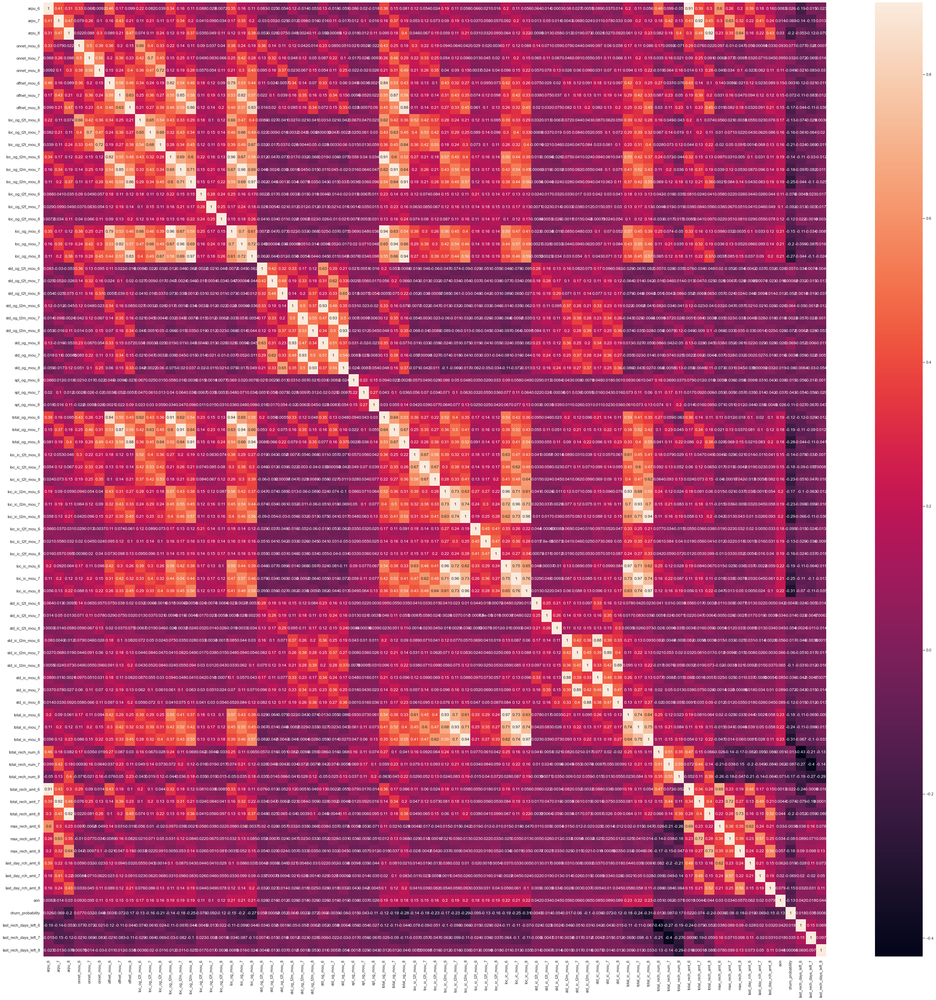

In [27]:
#Plotting heatmap of correlations
plt.figure(figsize=(50,50))

#heatmap
sns.heatmap(corr, vmax=0.9, annot=True)
plt.show()

##### Not using PCA for EDA as the objective of case study is to find most important features and using PCA changes them
although I tried building model with PCA but not got any significant result with it but the model got simplier but not able to fulfil accuracy and feature importance objective

### Logistic Regression Model Building

### Test-Train Split

In [28]:
#making a copy for later use
df_model_svm=df.copy(deep=True)

In [29]:
# Putting feature variable to X
X = df.drop(['churn_probability'], axis=1)

X.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,loc_og_t2t_mou_6,...,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,aon,last_rech_days_left_6,last_rech_days_left_7,last_rech_days_left_8
6,54.173,95.130,6.386,38.81,40.56,19.61,31.63,54.18,5.69,38.81,...,110,0,130,110,0,130,1083,1.0,12.0,5.0
7,167.861,167.869,167.866,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,198,198,198,198,198,0,584,10.0,9.0,3.0
8,163.550,90.250,51.726,0.00,0.00,0.00,47.81,50.88,21.74,0.00,...,200,0,150,200,0,150,2455,2.0,1.0,12.0
18,69.158,63.943,44.015,42.48,24.86,25.08,2.06,31.56,1.48,42.48,...,30,20,20,20,10,0,504,7.0,0.0,5.0
26,0.000,36.344,104.570,0.00,2.86,1.75,0.00,28.66,86.83,0.00,...,0,20,30,0,20,20,1276,16.0,2.0,1.0


In [30]:
# Putting response variable to y
y = df['churn_probability']

y.head()

6     0
7     0
8     1
18    0
26    0
Name: churn_probability, dtype: int64

In [31]:
from sklearn.model_selection import train_test_split

In [32]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)
X_train2=X_train
X_test2=X_test
y_train2=y_train
y_test2=y_test
X_train_svm=X_train
X_test_svm=X_test
y_train_svm=y_train
y_test_svm=y_test

### Step 5: Feature Scaling

In [33]:
from sklearn.preprocessing import StandardScaler

In [34]:
scaler = StandardScaler()
num_vars = X_train.columns

X_train[num_vars] = scaler.fit_transform(X_train[num_vars])

X_train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,loc_og_t2t_mou_6,...,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,aon,last_rech_days_left_6,last_rech_days_left_7,last_rech_days_left_8
32021,-0.500434,-0.259739,-1.185617,-0.625009,-0.672187,-0.668525,-0.911783,-0.893675,-0.896701,-0.595051,...,-0.631977,-0.408467,-1.045784,-0.576367,0.108418,-0.664955,0.295034,1.215988,-0.783616,0.366822
3413,-0.442204,-0.540887,-0.463249,-0.516396,-0.204457,-0.193293,-0.540139,-0.668465,-0.490685,-0.442881,...,-0.887289,-0.897863,-0.753437,-0.576367,-0.515737,-0.294795,-0.492022,-1.016136,-1.191401,-1.289997
8382,-0.494275,-0.389798,0.394218,-0.646151,-0.368448,0.175661,-0.120686,-0.199147,0.862383,-0.624672,...,-0.312838,-0.582124,-0.314915,0.170812,-0.106135,-0.664955,-1.009940,0.185777,0.643634,0.642958
43886,-0.568806,-0.967243,1.051068,-0.653198,-0.465891,1.660297,-0.084063,-0.716696,3.231927,-0.653712,...,-0.456451,-0.582124,0.079754,0.002696,-0.691281,0.464033,-0.572310,0.529180,1.255313,-0.737724
15376,0.918036,2.055273,1.149243,0.298202,0.527559,-0.490313,0.277117,1.864553,1.122670,0.698392,...,1.346688,1.375460,1.205291,2.113478,1.454252,-0.109715,1.473355,-1.187838,-0.579723,-0.461588


In [35]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5819 entries, 32021 to 47917
Data columns (total 76 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   arpu_6                 5819 non-null   float64
 1   arpu_7                 5819 non-null   float64
 2   arpu_8                 5819 non-null   float64
 3   onnet_mou_6            5819 non-null   float64
 4   onnet_mou_7            5819 non-null   float64
 5   onnet_mou_8            5819 non-null   float64
 6   offnet_mou_6           5819 non-null   float64
 7   offnet_mou_7           5819 non-null   float64
 8   offnet_mou_8           5819 non-null   float64
 9   loc_og_t2t_mou_6       5819 non-null   float64
 10  loc_og_t2t_mou_7       5819 non-null   float64
 11  loc_og_t2t_mou_8       5819 non-null   float64
 12  loc_og_t2m_mou_6       5819 non-null   float64
 13  loc_og_t2m_mou_7       5819 non-null   float64
 14  loc_og_t2m_mou_8       5819 non-null   float64
 15 

In [36]:
X_train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,loc_og_t2t_mou_6,...,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,aon,last_rech_days_left_6,last_rech_days_left_7,last_rech_days_left_8
32021,-0.500434,-0.259739,-1.185617,-0.625009,-0.672187,-0.668525,-0.911783,-0.893675,-0.896701,-0.595051,...,-0.631977,-0.408467,-1.045784,-0.576367,0.108418,-0.664955,0.295034,1.215988,-0.783616,0.366822
3413,-0.442204,-0.540887,-0.463249,-0.516396,-0.204457,-0.193293,-0.540139,-0.668465,-0.490685,-0.442881,...,-0.887289,-0.897863,-0.753437,-0.576367,-0.515737,-0.294795,-0.492022,-1.016136,-1.191401,-1.289997
8382,-0.494275,-0.389798,0.394218,-0.646151,-0.368448,0.175661,-0.120686,-0.199147,0.862383,-0.624672,...,-0.312838,-0.582124,-0.314915,0.170812,-0.106135,-0.664955,-1.009940,0.185777,0.643634,0.642958
43886,-0.568806,-0.967243,1.051068,-0.653198,-0.465891,1.660297,-0.084063,-0.716696,3.231927,-0.653712,...,-0.456451,-0.582124,0.079754,0.002696,-0.691281,0.464033,-0.572310,0.529180,1.255313,-0.737724
15376,0.918036,2.055273,1.149243,0.298202,0.527559,-0.490313,0.277117,1.864553,1.122670,0.698392,...,1.346688,1.375460,1.205291,2.113478,1.454252,-0.109715,1.473355,-1.187838,-0.579723,-0.461588


In [37]:
import statsmodels.api as sm

In [38]:
# Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                 5819
Model:                            GLM   Df Residuals:                     5742
Model Family:                Binomial   Df Model:                           76
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1193.3
Date:                Wed, 13 Apr 2022   Deviance:                       2386.6
Time:                        16:10:36   Pearson chi2:                 4.97e+05
No. Iterations:                     9                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -4.3334      0.167    -26.024      0.000      -4.660      -4.007
arpu_6                    0.1403      0.137      1.025      0.305      -0.128       0.408
arpu_7                    0.4540      0.156      2.901      0.004       0.147       0.761
arpu_8                   -0.1824      0.185     -0.988      0.323      -0.544       0.179
onnet_mou_6               0.1167      0.063      1.846      0.065      -0.007       0.241
onnet_mou_7               0.0918      0.070      1.317      0.188      -0.045       0.228
onnet_mou_8               0.2092      0.076      2.770      0.006       0.061       0.357
offnet_mou_6              0.0497      0.101      0.494      0.622      -0.148       0.247
offnet_mou_7              0.2162      0.124      1.747      0.081      -0.026       0.459
offnet_mou_8              0.4896      0.144      3.408      0.001       0.208       0.771
loc_og_t2t_mou_6        293.2240    229.746      1.276      0.202    -157.070     743.518
loc_og_t2t_mou_7        249.4238    236.196      1.056      0.291    -213.511     712.359
loc_og_t2t_mou_8        789.1684    287.394      2.746      0.006     225.887    1352.450
loc_og_t2m_mou_6        810.9281    635.055      1.277      0.202    -433.756    2055.612
loc_og_t2m_mou_7        684.7285    648.256      1.056      0.291    -585.830    1955.287
loc_og_t2m_mou_8       2245.7391    817.876      2.746      0.006     642.731    3848.747
loc_og_t2f_mou_6         13.5574     10.631      1.275      0.202      -7.278      34.393
loc_og_t2f_mou_7         11.8475     11.392      1.040      0.298     -10.481      34.176
loc_og_t2f_mou_8         36.7014     13.408      2.737      0.006      10.422      62.981
loc_og_mou_6           -975.4235    762.014     -1.280      0.201   -2468.943     518.096
loc_og_mou_7           -820.0587    782.854     -1.048      0.295   -2354.425     714.308
loc_og_mou_8          -2699.0030    982.881     -2.746      0.006   -4625.415    -772.591
std_og_t2t_mou_6          1.1595      0.611      1.898      0.058      -0.038       2.357
std_og_t2t_mou_7         -0.1139      0.203     -0.561      0.575      -0.512       0.284
std_og_t2t_mou_8         -0.6103      0.252     -2.423      0.015      -1.104      -0.117
std_og_t2m_mou_6          2.7202      1.370      1.985      0.047       0.034       5.406
std_og_t2m_mou_7         -0.1313      0.456     -0.288      0.773      -1.025       0.762
std_og_t2m_mou_8         -1.2056      0.530     -2.276      0.023      -2.243      -0.168
std_og_mou_6             -4.1361      1.766     -2.342      0.019      -7.598      -0.674
std_og_mou_7              2.6864      1.742      1.542      0.123      -0.728       6.101
std_og_mou_8              1.4012      1.332      1.052      0.293      -1.209       4.011
spl_og_mou_6           

### Feature Selection through RFE

#### Too many features. Lets use RFE to choose top 15 features

In [39]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

In [40]:
from sklearn.feature_selection import RFE
rfe = RFE(logreg, 15)             # running RFE with 15 variables as output
rfe = rfe.fit(X_train, y_train)

In [41]:
rfe.support_

array([False, False,  True, False, False, False, False,  True,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False,  True, False, False,  True, False, False,
        True, False, False, False, False, False, False, False,  True,
       False, False,  True, False, False,  True, False, False,  True,
       False, False,  True, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False,  True, False, False,  True, False, False,  True,
       False, False, False, False])

In [42]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('arpu_6', False, 19),
 ('arpu_7', False, 13),
 ('arpu_8', True, 1),
 ('onnet_mou_6', False, 17),
 ('onnet_mou_7', False, 39),
 ('onnet_mou_8', False, 7),
 ('offnet_mou_6', False, 43),
 ('offnet_mou_7', True, 1),
 ('offnet_mou_8', True, 1),
 ('loc_og_t2t_mou_6', False, 16),
 ('loc_og_t2t_mou_7', False, 62),
 ('loc_og_t2t_mou_8', False, 29),
 ('loc_og_t2m_mou_6', False, 53),
 ('loc_og_t2m_mou_7', False, 38),
 ('loc_og_t2m_mou_8', False, 28),
 ('loc_og_t2f_mou_6', False, 54),
 ('loc_og_t2f_mou_7', False, 11),
 ('loc_og_t2f_mou_8', False, 26),
 ('loc_og_mou_6', False, 37),
 ('loc_og_mou_7', False, 23),
 ('loc_og_mou_8', False, 3),
 ('std_og_t2t_mou_6', True, 1),
 ('std_og_t2t_mou_7', False, 44),
 ('std_og_t2t_mou_8', False, 6),
 ('std_og_t2m_mou_6', True, 1),
 ('std_og_t2m_mou_7', False, 45),
 ('std_og_t2m_mou_8', False, 4),
 ('std_og_mou_6', True, 1),
 ('std_og_mou_7', False, 24),
 ('std_og_mou_8', False, 5),
 ('spl_og_mou_6', False, 48),
 ('spl_og_mou_7', False, 41),
 ('spl_og_mou_8', 

In [43]:
col = X_train.columns[rfe.support_]

In [44]:
X_train.columns[~rfe.support_]

Index(['arpu_6', 'arpu_7', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8',
       'offnet_mou_6', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7',
       'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7',
       'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7',
       'loc_og_t2f_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8',
       'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_7',
       'std_og_t2m_mou_8', 'std_og_mou_7', 'std_og_mou_8', 'spl_og_mou_6',
       'spl_og_mou_7', 'spl_og_mou_8', 'total_og_mou_6', 'total_og_mou_7',
       'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'loc_ic_t2m_mou_6',
       'loc_ic_t2m_mou_7', 'loc_ic_t2f_mou_6', 'loc_ic_t2f_mou_7',
       'loc_ic_mou_6', 'loc_ic_mou_7', 'std_ic_t2t_mou_6', 'std_ic_t2t_mou_7',
       'std_ic_t2t_mou_8', 'std_ic_t2m_mou_6', 'std_ic_t2m_mou_7',
       'std_ic_t2m_mou_8', 'std_ic_mou_6', 'std_ic_mou_7', 'std_ic_mou_8',
       'total_ic_mou_6', 'total_ic_mou_7', 'total_ic_mou_8',
       'total_rech_num_

##### Assessing the model with StatsModels

In [45]:
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                 5819
Model:                            GLM   Df Residuals:                     5803
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1271.6
Date:                Wed, 13 Apr 2022   Deviance:                       2543.2
Time:                        16:10:41   Pearson chi2:                 1.29e+06
No. Iterations:                     9                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -4.3685      0.166    -26.375      0.000      -4.693      -4.044
arpu_8                -0.4546      0.161     -2.824      0.005      -0.770      -0.139
offnet_mou_7           0.1546      0.063      2.463      0.014       0.032       0.278
offnet_mou_8           0.6735      0.118      5.714      0.000       0.442       0.904
std_og_t2t_mou_6       0.8422      0.428      1.970      0.049       0.004       1.680
std_og_t2m_mou_6       1.8839      0.959      1.963      0.050       0.003       3.764
std_og_mou_6          -2.3157      1.188     -1.950      0.051      -4.643       0.012
total_og_mou_8        -1.1856      0.159     -7.443      0.000      -1.498      -0.873
loc_ic_t2t_mou_8    1945.5008    278.044      6.997      0.000    1400.544    2490.458
loc_ic_t2m_mou_8    5769.4733    824.550      6.997      0.000    4153.384    7385.563
loc_ic_t2f_mou_8     332.5311     47.617      6.984      0.000     239.204     425.858
loc_ic_mou_8       -6914.9736    987.882     -7.000      0.000   -8851.187   -4978.760
total_rech_num_8      -0.5636      0.083     -6.781      0.000      -0.727      -0.401
total_rech_amt_8       0.6862      0.210      3.267      0.001       0.275       1.098
max_rech_amt_8        -0.6657      0.108     -6.164      0.000      -0.877      -0.454
last_day_rch_amt_8    -0.3973      0.088     -4.522      0.000      -0.570      -0.225
======================================================================================
"""

In [46]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

32021    0.203360
3413     0.003666
8382     0.069934
43886    0.075833
15376    0.000003
1404     0.410489
54319    0.000011
64832    0.009428
54984    0.066621
19719    0.020298
dtype: float64

In [47]:
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([2.03359518e-01, 3.66553632e-03, 6.99339343e-02, 7.58333639e-02,
       2.71024303e-06, 4.10488873e-01, 1.09397562e-05, 9.42834625e-03,
       6.66206182e-02, 2.02975218e-02])

##### Creating a dataframe with the actual churn flag and the predicted probabilities

In [48]:
y_train_pred_final = pd.DataFrame({'Churn':y_train.values, 'Churn_Prob':y_train_pred})
y_train_pred_final['CustID'] = y_train.index
y_train_pred_final.head()

,Churn,Churn_Prob,CustID
0,0,0.203360,32021
1,0,0.003666,3413
2,0,0.069934,8382
3,0,0.075833,43886
4,0,0.000003,15376


##### Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0

In [49]:
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,Churn,Churn_Prob,CustID,predicted
0,0,0.203360,32021,0
1,0,0.003666,3413,0
2,0,0.069934,8382,0
3,0,0.075833,43886,0
4,0,0.000003,15376,0


In [50]:
from sklearn import metrics

In [51]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.predicted )
print(confusion)

[[4971  161]
 [ 333  354]]


In [52]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.9151056882625881


#### Checking VIFs

In [53]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [54]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
10,loc_ic_mou_8,1.442418e+08
8,loc_ic_t2m_mou_8,1.004829e+08
7,loc_ic_t2t_mou_8,1.142462e+07
9,loc_ic_t2f_mou_8,3.349717e+05
5,std_og_mou_6,6.340000e+01
4,std_og_t2m_mou_6,4.266000e+01
12,total_rech_amt_8,1.139000e+01
3,std_og_t2t_mou_6,9.190000e+00
0,arpu_8,7.120000e+00
2,offnet_mou_8,6.000000e+00


There are a few variables with high VIF / high p value. It's best to drop these variables as they aren't helping much with prediction and unnecessarily making the model complex. The variable 'std_og_mou' has the highest p. So let's start by dropping that.

In [55]:
#Lets drop the columns one by one - std_og_mou_6 as it has high p
col = col.drop(['std_og_mou_6'], 1)
col

Index(['arpu_8', 'offnet_mou_7', 'offnet_mou_8', 'std_og_t2t_mou_6',
       'std_og_t2m_mou_6', 'total_og_mou_8', 'loc_ic_t2t_mou_8',
       'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_8', 'loc_ic_mou_8',
       'total_rech_num_8', 'total_rech_amt_8', 'max_rech_amt_8',
       'last_day_rch_amt_8'],
      dtype='object')

In [56]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                 5819
Model:                            GLM   Df Residuals:                     5804
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1275.3
Date:                Wed, 13 Apr 2022   Deviance:                       2550.6
Time:                        16:10:41   Pearson chi2:                 1.33e+06
No. Iterations:                     9                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -4.3560      0.165    -26.363      0.000      -4.680      -4.032
arpu_8                -0.4264      0.159     -2.683      0.007      -0.738      -0.115
offnet_mou_7           0.1527      0.063      2.432      0.015       0.030       0.276
offnet_mou_8           0.6713      0.118      5.699      0.000       0.440       0.902
std_og_t2t_mou_6       0.0142      0.042      0.335      0.737      -0.069       0.097
std_og_t2m_mou_6       0.0144      0.044      0.325      0.745      -0.072       0.101
total_og_mou_8        -1.2016      0.159     -7.546      0.000      -1.514      -0.890
loc_ic_t2t_mou_8    1945.4140    277.654      7.007      0.000    1401.222    2489.606
loc_ic_t2m_mou_8    5769.2182    823.393      7.007      0.000    4155.398    7383.039
loc_ic_t2f_mou_8     332.5008     47.550      6.993      0.000     239.305     425.697
loc_ic_mou_8       -6914.6607    986.495     -7.009      0.000   -8848.155   -4981.166
total_rech_num_8      -0.5540      0.083     -6.689      0.000      -0.716      -0.392
total_rech_amt_8       0.6573      0.208      3.158      0.002       0.249       1.065
max_rech_amt_8        -0.6664      0.108     -6.177      0.000      -0.878      -0.455
last_day_rch_amt_8    -0.3914      0.087     -4.475      0.000      -0.563      -0.220
======================================================================================
"""

In [57]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)

In [58]:
y_train_pred[:10]

array([2.00707130e-01, 3.65845289e-03, 7.22968903e-02, 7.28436907e-02,
       2.64327499e-06, 4.04685395e-01, 1.02707432e-05, 9.17805011e-03,
       6.51750448e-02, 1.98853669e-02])

In [59]:
y_train_pred_final['Churn_Prob'] = y_train_pred

In [60]:
# Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,CustID,predicted
0,0,0.200707,32021,0
1,0,0.003658,3413,0
2,0,0.072297,8382,0
3,0,0.072844,43886,0
4,0,0.000003,15376,0


In [61]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.9154493899295412


So overall the accuracy hasn't dropped much.

##### Let's check the VIFs again

In [62]:
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
9,loc_ic_mou_8,1.442417e+08
7,loc_ic_t2m_mou_8,1.004828e+08
6,loc_ic_t2t_mou_8,1.142461e+07
8,loc_ic_t2f_mou_8,3.349715e+05
11,total_rech_amt_8,1.137000e+01
0,arpu_8,7.110000e+00
2,offnet_mou_8,6.000000e+00
5,total_og_mou_8,5.560000e+00
12,max_rech_amt_8,3.390000e+00
10,total_rech_num_8,1.830000e+00


In [63]:
# Let's drop std_og_t2m_mou_6 since it has a high p
col = col.drop('std_og_t2m_mou_6')
col

Index(['arpu_8', 'offnet_mou_7', 'offnet_mou_8', 'std_og_t2t_mou_6',
       'total_og_mou_8', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_8',
       'loc_ic_t2f_mou_8', 'loc_ic_mou_8', 'total_rech_num_8',
       'total_rech_amt_8', 'max_rech_amt_8', 'last_day_rch_amt_8'],
      dtype='object')

In [64]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm4 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm4.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                 5819
Model:                            GLM   Df Residuals:                     5805
Model Family:                Binomial   Df Model:                           13
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1275.3
Date:                Wed, 13 Apr 2022   Deviance:                       2550.7
Time:                        16:10:41   Pearson chi2:                 1.34e+06
No. Iterations:                     9                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -4.3568      0.165    -26.362      0.000      -4.681      -4.033
arpu_8                -0.4271      0.159     -2.688      0.007      -0.738      -0.116
offnet_mou_7           0.1546      0.063      2.472      0.013       0.032       0.277
offnet_mou_8           0.6717      0.118      5.702      0.000       0.441       0.903
std_og_t2t_mou_6       0.0194      0.039      0.495      0.620      -0.057       0.096
total_og_mou_8        -1.1972      0.159     -7.551      0.000      -1.508      -0.886
loc_ic_t2t_mou_8    1946.9278    277.585      7.014      0.000    1402.871    2490.985
loc_ic_t2m_mou_8    5773.7068    823.189      7.014      0.000    4160.286    7387.128
loc_ic_t2f_mou_8     332.7599     47.538      7.000      0.000     239.587     425.933
loc_ic_mou_8       -6920.0440    986.251     -7.017      0.000   -8853.059   -4987.029
total_rech_num_8      -0.5556      0.083     -6.718      0.000      -0.718      -0.394
total_rech_amt_8       0.6576      0.208      3.159      0.002       0.250       1.066
max_rech_amt_8        -0.6672      0.108     -6.186      0.000      -0.879      -0.456
last_day_rch_amt_8    -0.3916      0.087     -4.476      0.000      -0.563      -0.220
======================================================================================
"""

In [65]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)

In [66]:
y_train_pred[:10]

array([2.01142939e-01, 3.64972386e-03, 7.27376587e-02, 7.37141152e-02,
       2.61470701e-06, 4.04719546e-01, 1.02499006e-05, 9.11971506e-03,
       6.59012153e-02, 2.00106317e-02])

In [67]:
y_train_pred_final['Churn_Prob'] = y_train_pred

In [68]:
# Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,CustID,predicted
0,0,0.201143,32021,0
1,0,0.003650,3413,0
2,0,0.072738,8382,0
3,0,0.073714,43886,0
4,0,0.000003,15376,0


In [69]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.9145901357621584


The accuracy is still practically the same.

##### Let's now check the VIFs again

In [70]:
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
8,loc_ic_mou_8,1.441487e+08
6,loc_ic_t2m_mou_8,1.004180e+08
5,loc_ic_t2t_mou_8,1.141725e+07
7,loc_ic_t2f_mou_8,3.347557e+05
10,total_rech_amt_8,1.137000e+01
0,arpu_8,7.110000e+00
2,offnet_mou_8,6.000000e+00
4,total_og_mou_8,5.560000e+00
11,max_rech_amt_8,3.390000e+00
9,total_rech_num_8,1.830000e+00


In [71]:
# Let's drop std_og_t2t_mou_6 since it has a high VIF
col = col.drop('std_og_t2t_mou_6')
col

Index(['arpu_8', 'offnet_mou_7', 'offnet_mou_8', 'total_og_mou_8',
       'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_8',
       'loc_ic_mou_8', 'total_rech_num_8', 'total_rech_amt_8',
       'max_rech_amt_8', 'last_day_rch_amt_8'],
      dtype='object')

In [72]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm4 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm4.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                 5819
Model:                            GLM   Df Residuals:                     5806
Model Family:                Binomial   Df Model:                           12
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1275.5
Date:                Wed, 13 Apr 2022   Deviance:                       2550.9
Time:                        16:10:42   Pearson chi2:                 1.36e+06
No. Iterations:                     9                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -4.3596      0.165    -26.374      0.000      -4.684      -4.036
arpu_8                -0.4311      0.159     -2.717      0.007      -0.742      -0.120
offnet_mou_7           0.1550      0.063      2.478      0.013       0.032       0.278
offnet_mou_8           0.6711      0.118      5.693      0.000       0.440       0.902
total_og_mou_8        -1.1938      0.158     -7.532      0.000      -1.504      -0.883
loc_ic_t2t_mou_8    1945.3689    277.573      7.008      0.000    1401.335    2489.403
loc_ic_t2m_mou_8    5769.0812    823.154      7.009      0.000    4155.728    7382.434
loc_ic_t2f_mou_8     332.4923     47.536      6.995      0.000     239.323     425.661
loc_ic_mou_8       -6914.5097    986.209     -7.011      0.000   -8847.444   -4981.576
total_rech_num_8      -0.5577      0.083     -6.752      0.000      -0.720      -0.396
total_rech_amt_8       0.6631      0.208      3.191      0.001       0.256       1.070
max_rech_amt_8        -0.6703      0.108     -6.225      0.000      -0.881      -0.459
last_day_rch_amt_8    -0.3925      0.087     -4.486      0.000      -0.564      -0.221
======================================================================================
"""

In [73]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)

In [74]:
y_train_pred[:10]

array([2.02607500e-01, 3.65844380e-03, 7.33355069e-02, 7.43563884e-02,
       2.55358565e-06, 4.04967396e-01, 1.01231511e-05, 9.13797968e-03,
       6.63600127e-02, 1.99694257e-02])

In [75]:
y_train_pred_final['Churn_Prob'] = y_train_pred

In [76]:
# Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,CustID,predicted
0,0,0.202607,32021,0
1,0,0.003658,3413,0
2,0,0.073336,8382,0
3,0,0.074356,43886,0
4,0,0.000003,15376,0


In [77]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.9149338374291115


The accuracy is still practically the same.

##### Let's now check the VIFs again

In [78]:
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
7,loc_ic_mou_8,1.441027e+08
5,loc_ic_t2m_mou_8,1.003860e+08
4,loc_ic_t2t_mou_8,1.141362e+07
6,loc_ic_t2f_mou_8,3.346495e+05
9,total_rech_amt_8,1.135000e+01
0,arpu_8,7.100000e+00
2,offnet_mou_8,5.980000e+00
3,total_og_mou_8,5.510000e+00
10,max_rech_amt_8,3.390000e+00
8,total_rech_num_8,1.830000e+00


In [79]:
# Let's drop loc_ic_mou_8 since it has a high VIF value
col = col.drop(['loc_ic_mou_8'])
col

Index(['arpu_8', 'offnet_mou_7', 'offnet_mou_8', 'total_og_mou_8',
       'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_8',
       'total_rech_num_8', 'total_rech_amt_8', 'max_rech_amt_8',
       'last_day_rch_amt_8'],
      dtype='object')

In [80]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm4 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm4.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                 5819
Model:                            GLM   Df Residuals:                     5807
Model Family:                Binomial   Df Model:                           11
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1303.1
Date:                Wed, 13 Apr 2022   Deviance:                       2606.2
Time:                        16:10:42   Pearson chi2:                 4.04e+06
No. Iterations:                     9                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -4.5447      0.175    -26.040      0.000      -4.887      -4.203
arpu_8                -0.4323      0.158     -2.730      0.006      -0.743      -0.122
offnet_mou_7           0.1499      0.061      2.439      0.015       0.029       0.270
offnet_mou_8           0.7014      0.117      5.994      0.000       0.472       0.931
total_og_mou_8        -1.3125      0.158     -8.288      0.000      -1.623      -1.002
loc_ic_t2t_mou_8      -0.8396      0.178     -4.723      0.000      -1.188      -0.491
loc_ic_t2m_mou_8      -2.3028      0.242     -9.528      0.000      -2.776      -1.829
loc_ic_t2f_mou_8      -0.8695      0.207     -4.205      0.000      -1.275      -0.464
total_rech_num_8      -0.5482      0.082     -6.691      0.000      -0.709      -0.388
total_rech_amt_8       0.6568      0.208      3.163      0.002       0.250       1.064
max_rech_amt_8        -0.6657      0.107     -6.210      0.000      -0.876      -0.456
last_day_rch_amt_8    -0.3867      0.087     -4.422      0.000      -0.558      -0.215
======================================================================================
"""

In [81]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)

In [82]:
y_train_pred[:10]

array([3.76314298e-01, 1.26223253e-02, 4.01024510e-02, 4.54647352e-02,
       7.16483619e-07, 4.03595659e-01, 1.46107429e-06, 1.66376430e-02,
       5.00010212e-02, 3.40563677e-02])

In [83]:
y_train_pred_final['Churn_Prob'] = y_train_pred

In [84]:
# Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,CustID,predicted
0,0,3.763143e-01,32021,0
1,0,1.262233e-02,3413,0
2,0,4.010245e-02,8382,0
3,0,4.546474e-02,43886,0
4,0,7.164836e-07,15376,0


In [85]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.9151056882625881


The accuracy is still practically the same.

##### Let's now check the VIFs again

In [86]:
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
8,total_rech_amt_8,11.35
0,arpu_8,7.10
2,offnet_mou_8,5.95
3,total_og_mou_8,5.43
9,max_rech_amt_8,3.38
7,total_rech_num_8,1.82
1,offnet_mou_7,1.72
10,last_day_rch_amt_8,1.63
5,loc_ic_t2m_mou_8,1.58
4,loc_ic_t2t_mou_8,1.36


In [87]:
# Let's drop total_rech_amt_8 since it has a high VIF value
col = col.drop(['total_rech_amt_8'])
col

Index(['arpu_8', 'offnet_mou_7', 'offnet_mou_8', 'total_og_mou_8',
       'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_8',
       'total_rech_num_8', 'max_rech_amt_8', 'last_day_rch_amt_8'],
      dtype='object')

In [88]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm4 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm4.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                 5819
Model:                            GLM   Df Residuals:                     5808
Model Family:                Binomial   Df Model:                           10
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1308.1
Date:                Wed, 13 Apr 2022   Deviance:                       2616.1
Time:                        16:10:42   Pearson chi2:                 4.51e+06
No. Iterations:                     9                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -4.5735      0.175    -26.150      0.000      -4.916      -4.231
arpu_8                -0.0769      0.113     -0.681      0.496      -0.298       0.145
offnet_mou_7           0.1521      0.061      2.477      0.013       0.032       0.273
offnet_mou_8           0.7845      0.116      6.780      0.000       0.558       1.011
total_og_mou_8        -1.4088      0.158     -8.920      0.000      -1.718      -1.099
loc_ic_t2t_mou_8      -0.8235      0.177     -4.640      0.000      -1.171      -0.476
loc_ic_t2m_mou_8      -2.3032      0.242     -9.524      0.000      -2.777      -1.829
loc_ic_t2f_mou_8      -0.8724      0.208     -4.197      0.000      -1.280      -0.465
total_rech_num_8      -0.4471      0.075     -5.950      0.000      -0.594      -0.300
max_rech_amt_8        -0.4692      0.088     -5.339      0.000      -0.641      -0.297
last_day_rch_amt_8    -0.3149      0.083     -3.814      0.000      -0.477      -0.153
======================================================================================
"""

In [89]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)

In [90]:
y_train_pred[:10]

array([3.65426751e-01, 1.35652138e-02, 3.37863771e-02, 4.41444575e-02,
       1.00053643e-06, 3.87649189e-01, 1.49873333e-06, 1.57133280e-02,
       5.48631389e-02, 3.29269196e-02])

In [91]:
y_train_pred_final['Churn_Prob'] = y_train_pred

In [92]:
# Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,CustID,predicted
0,0,0.365427,32021,0
1,0,0.013565,3413,0
2,0,0.033786,8382,0
3,0,0.044144,43886,0
4,0,0.000001,15376,0


In [93]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.9171678982643066


The accuracy is still practically the same.

##### Let's now check the VIFs again

In [94]:
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
2,offnet_mou_8,5.84
3,total_og_mou_8,5.39
0,arpu_8,3.05
8,max_rech_amt_8,2.43
1,offnet_mou_7,1.72
5,loc_ic_t2m_mou_8,1.58
7,total_rech_num_8,1.52
9,last_day_rch_amt_8,1.50
4,loc_ic_t2t_mou_8,1.36
6,loc_ic_t2f_mou_8,1.11


In [95]:
# Let's drop offnet_mou_8 since it has a high VIF value
col = col.drop(['offnet_mou_8'])
col

Index(['arpu_8', 'offnet_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_8',
       'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_8', 'total_rech_num_8',
       'max_rech_amt_8', 'last_day_rch_amt_8'],
      dtype='object')

In [96]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm4 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm4.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                 5819
Model:                            GLM   Df Residuals:                     5809
Model Family:                Binomial   Df Model:                            9
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1333.9
Date:                Wed, 13 Apr 2022   Deviance:                       2667.8
Time:                        16:10:42   Pearson chi2:                 1.25e+07
No. Iterations:                     9                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -4.6410      0.178    -26.005      0.000      -4.991      -4.291
arpu_8                 0.2647      0.095      2.788      0.005       0.079       0.451
offnet_mou_7           0.3338      0.056      5.919      0.000       0.223       0.444
total_og_mou_8        -0.9069      0.136     -6.664      0.000      -1.174      -0.640
loc_ic_t2t_mou_8      -0.9487      0.181     -5.247      0.000      -1.303      -0.594
loc_ic_t2m_mou_8      -2.4296      0.245     -9.901      0.000      -2.911      -1.949
loc_ic_t2f_mou_8      -0.9089      0.212     -4.294      0.000      -1.324      -0.494
total_rech_num_8      -0.4470      0.072     -6.208      0.000      -0.588      -0.306
max_rech_amt_8        -0.5831      0.085     -6.897      0.000      -0.749      -0.417
last_day_rch_amt_8    -0.3004      0.078     -3.859      0.000      -0.453      -0.148
======================================================================================
"""

In [97]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)

In [98]:
y_train_pred[:10]

array([3.36926468e-01, 1.19447105e-02, 3.17993693e-02, 1.18210457e-02,
       7.14750242e-07, 1.54008210e-01, 7.94271690e-07, 1.20030827e-02,
       5.37241240e-02, 3.40224702e-02])

In [99]:
y_train_pred_final['Churn_Prob'] = y_train_pred

In [100]:
# Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,CustID,predicted
0,0,3.369265e-01,32021,0
1,0,1.194471e-02,3413,0
2,0,3.179937e-02,8382,0
3,0,1.182105e-02,43886,0
4,0,7.147502e-07,15376,0


In [101]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.9114968207595807


The accuracy is still practically the same.

##### Let's now check the VIFs again

In [102]:
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,arpu_8,2.86
7,max_rech_amt_8,2.42
2,total_og_mou_8,2.11
4,loc_ic_t2m_mou_8,1.57
1,offnet_mou_7,1.54
6,total_rech_num_8,1.52
8,last_day_rch_amt_8,1.50
3,loc_ic_t2t_mou_8,1.28
5,loc_ic_t2f_mou_8,1.11


All variables have a good value of VIF. So we need not drop any more variables and we can proceed with making predictions using this model only

In [103]:
# Let's take a look at the confusion matrix again 
confusion = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.predicted )
confusion

array([[5003,  129],
       [ 386,  301]], dtype=int64)

In [104]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted)

0.9114968207595807

## Metrics beyond simply accuracy

In [105]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [106]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.438136826783115

In [107]:
# Let us calculate specificity
TN / float(TN+FP)

0.9748636009353079

In [108]:
# Calculate false postive rate - predicting churn when customer does not have churned
print(FP/ float(TN+FP))

0.025136399064692127


In [109]:
# positive predictive value 
print (TP / float(TP+FP))

0.7


In [110]:
# Negative predictive value
print (TN / float(TN+ FN))

0.9283726108740026


### Step 9: Plotting the ROC Curve

An ROC curve demonstrates several things:

- It shows the tradeoff between sensitivity and specificity (any increase in sensitivity will be accompanied by a decrease in specificity).
- The closer the curve follows the left-hand border and then the top border of the ROC space, the more accurate the test.
- The closer the curve comes to the 45-degree diagonal of the ROC space, the less accurate the test.

In [111]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [112]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Churn, y_train_pred_final.Churn_Prob, drop_intermediate = False )

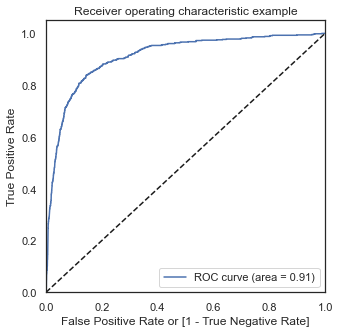

In [113]:
draw_roc(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob)

### Step 10: Finding Optimal Cutoff Point

Optimal cutoff probability is that prob where we get balanced sensitivity and specificity

In [114]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,CustID,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,3.369265e-01,32021,0,1,1,1,1,0,0,0,0,0,0
1,0,1.194471e-02,3413,0,1,0,0,0,0,0,0,0,0,0
2,0,3.179937e-02,8382,0,1,0,0,0,0,0,0,0,0,0
3,0,1.182105e-02,43886,0,1,0,0,0,0,0,0,0,0,0
4,0,7.147502e-07,15376,0,1,0,0,0,0,0,0,0,0,0


In [115]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.118062  1.000000  0.000000
0.1   0.1  0.773501  0.896652  0.757015
0.2   0.2  0.858910  0.825328  0.863406
0.3   0.3  0.898092  0.735080  0.919914
0.4   0.4  0.911497  0.628821  0.949337
0.5   0.5  0.911497  0.438137  0.974864
0.6   0.6  0.891047  0.110626  0.995518
0.7   0.7  0.884344  0.029112  0.998831
0.8   0.8  0.882798  0.007278  1.000000
0.9   0.9  0.882110  0.001456  1.000000


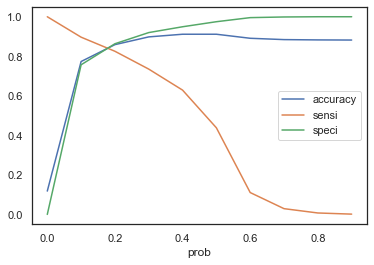

In [116]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

#### From the curve above, 0.2 is the optimum point to take it as a cutoff probability.

In [117]:
y_train_pred_final['final_predicted'] = y_train_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.2 else 0)

y_train_pred_final.head()

,Churn,Churn_Prob,CustID,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,3.369265e-01,32021,0,1,1,1,1,0,0,0,0,0,0,1
1,0,1.194471e-02,3413,0,1,0,0,0,0,0,0,0,0,0,0
2,0,3.179937e-02,8382,0,1,0,0,0,0,0,0,0,0,0,0
3,0,1.182105e-02,43886,0,1,0,0,0,0,0,0,0,0,0,0
4,0,7.147502e-07,15376,0,1,0,0,0,0,0,0,0,0,0,0


In [118]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.final_predicted)

0.8589104657157587

In [119]:
confusion2 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.final_predicted )
confusion2

array([[4431,  701],
       [ 120,  567]], dtype=int64)

In [120]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [121]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.8253275109170306

In [122]:
# Let us calculate specificity
TN / float(TN+FP)

0.8634060795011691

In [123]:
# Calculate false postive rate - predicting churn when customer does not have churned
print(FP/ float(TN+FP))

0.13659392049883087


In [124]:
# Positive predictive value 
print (TP / float(TP+FP))

0.4471608832807571


In [125]:
# Negative predictive value
print (TN / float(TN+ FN))

0.97363216875412


### Step 11: Making predictions on the test set

In [126]:
num_vars = X_test.columns

X_test[num_vars] = scaler.transform(X_test[num_vars])

In [127]:
X_test = X_test[col]
X_test.head()

,arpu_8,offnet_mou_7,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_t2f_mou_8,total_rech_num_8,max_rech_amt_8,last_day_rch_amt_8
22069,-1.164088,-0.378094,-0.918227,-0.713965,-0.876775,-0.491370,-0.902760,-1.045784,-0.664955
29968,-1.185617,-0.391481,-0.923245,-0.713965,-0.876775,-0.491370,-0.597450,-1.045784,-0.664955
55499,0.819918,-0.893675,-0.552436,-0.288958,-0.870960,-0.491370,0.318479,0.854474,-0.664955
22871,-0.771945,0.134140,-0.265089,-0.492561,0.311648,1.033216,-0.292140,-0.314915,-0.664955
40445,-1.176810,-0.339313,-0.935120,-0.713965,-0.876775,-0.491370,-0.292140,-1.045784,-0.664955


In [128]:
X_test_sm = sm.add_constant(X_test)

Making predictions on the test set

In [129]:
y_test_pred = res.predict(X_test_sm)

In [130]:
y_test_pred[:10]

22069    0.555887
29968    0.520590
55499    0.138802
22871    0.005090
40445    0.494116
24638    0.187744
50270    0.056179
4053     0.551694
22723    0.000859
3790     0.029021
dtype: float64

In [131]:
# Converting y_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

In [132]:
# Let's see the head
y_pred_1.head()

,0
22069,0.555887
29968,0.520590
55499,0.138802
22871,0.005090
40445,0.494116


In [133]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

In [134]:
# Putting CustID to index
y_test_df['CustID'] = y_test_df.index

In [135]:
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [136]:
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

In [137]:
y_pred_final.head()

,churn_probability,CustID,0
0,1,22069,0.555887
1,1,29968,0.520590
2,1,55499,0.138802
3,0,22871,0.005090
4,0,40445,0.494116


In [138]:
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'Churn_Prob', 'churn_probability': 'Churn'})

In [139]:
# Rearranging the columns
y_pred_final = y_pred_final.reindex(['CustID','Churn','Churn_Prob'], axis=1)

In [140]:
# Let's see the head of y_pred_final
y_pred_final.head()

,CustID,Churn,Churn_Prob
0,22069,1,0.555887
1,29968,1,0.520590
2,55499,1,0.138802
3,22871,0,0.005090
4,40445,0,0.494116


In [141]:
y_pred_final['final_predicted'] = y_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.2 else 0)

In [142]:
y_pred_final.head()

,CustID,Churn,Churn_Prob,final_predicted
0,22069,1,0.555887,1
1,29968,1,0.520590,1
2,55499,1,0.138802,0
3,22871,0,0.005090,0
4,40445,0,0.494116,1


In [143]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_pred_final.Churn, y_pred_final.final_predicted)

0.8504410585404972

In [144]:
confusion2 = metrics.confusion_matrix(y_pred_final.Churn, y_pred_final.final_predicted )
confusion2

array([[1874,  331],
       [  42,  247]], dtype=int64)

In [145]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [146]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.8546712802768166

In [147]:
# Let us calculate specificity
TN / float(TN+FP)

0.8498866213151928

### SVM

#### Feature scaling

In [148]:
df_model_svm.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8313 entries, 6 to 69998
Data columns (total 77 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   arpu_6                 8313 non-null   float64
 1   arpu_7                 8313 non-null   float64
 2   arpu_8                 8313 non-null   float64
 3   onnet_mou_6            8313 non-null   float64
 4   onnet_mou_7            8313 non-null   float64
 5   onnet_mou_8            8313 non-null   float64
 6   offnet_mou_6           8313 non-null   float64
 7   offnet_mou_7           8313 non-null   float64
 8   offnet_mou_8           8313 non-null   float64
 9   loc_og_t2t_mou_6       8313 non-null   float64
 10  loc_og_t2t_mou_7       8313 non-null   float64
 11  loc_og_t2t_mou_8       8313 non-null   float64
 12  loc_og_t2m_mou_6       8313 non-null   float64
 13  loc_og_t2m_mou_7       8313 non-null   float64
 14  loc_og_t2m_mou_8       8313 non-null   float64
 15  loc

In [149]:
# splitting into X and y
X = df_model_svm.drop("churn_probability", axis = 1)
y = df_model_svm.churn_probability.values.astype(int)


In [150]:
# scaling the features
# note that the scale function standardises each column, i.e.
# x = x-mean(x)/std(x)

from sklearn.preprocessing import scale
X = scale(X)

In [151]:
# split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 4)

In [152]:
# confirm that splitting also has similar distribution of churn and non churn customers
print(y_train.mean())
print(y_test.mean())

0.11720226843100189
0.11788291900561347


In [153]:
from sklearn.svm import SVC
# Model building

# instantiate an object of class SVC()
# note that we are using cost C=1
model = SVC(C = 1)

# fit
model.fit(X_train, y_train)

# predict
y_pred = model.predict(X_test)

In [154]:
# Evaluate the model using confusion matrix 
from sklearn import metrics
metrics.confusion_matrix(y_true=y_test, y_pred=y_pred)

array([[2145,   55],
       [ 162,  132]], dtype=int64)

In [155]:
# print other metrics

# accuracy
print("accuracy", metrics.accuracy_score(y_test, y_pred))

# precision
print("precision", metrics.precision_score(y_test, y_pred))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, y_pred))

accuracy 0.91299117882919
precision 0.7058823529411765
recall 0.4489795918367347


In [156]:
# specificity (% of non churns correctly classified)
print("specificity", 6413/(6413+71))

specificity 0.9890499691548427


The SVM we have built so far gives decently good results - an accuracy of 87%, sensitivity/recall (TNR) of 22%. 

### Interpretation of Results

In the confusion matrix, the elements at (0, 0) and (1,1) correspond to the more frequently occurring class, i.e.non churn. Thus, it implies that:
- 87% of all customers are classified correctly
- 22.5% of churns are identified correctly (sensitivity/recall)
- Specificity, or % of non churns classified correctly, is 99%


### Hyper parameter tuning

### K-Fold Cross Validation

Let's first run a simple k-fold cross validation to get a sense of the **average metrics** as computed over multiple *folds*. the easiest way to do cross-validation is to use the ```cross_val_score()``` function.

In [157]:
from sklearn.model_selection import validation_curve
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

In [158]:
# creating a KFold object with 5 splits 
folds = KFold(n_splits = 5, shuffle = True, random_state = 4)

# instantiating a model with cost=1
model = SVC(C = 1)

In [159]:
# computing the cross-validation scores 
# note that the argument cv takes the 'folds' object, and
# we have specified 'accuracy' as the metric

cv_results = cross_val_score(model, X_train, y_train, cv = folds, scoring = 'accuracy') 

In [160]:
# print 5 accuracies obtained from the 5 folds
print(cv_results)
print("mean accuracy = {}".format(cv_results.mean()))

[0.92783505 0.91323024 0.91924399 0.91151203 0.91143594]
mean accuracy = 0.9166514494744897


## Grid Search to Find Optimal Hyperparameter C

K-fold CV helps us compute average metrics over multiple folds, and that is the best indication of the 'test accuracy/other metric scores' we can have. 

But we want to use CV to compute the optimal values of hyperparameters (in this case, the cost C is a hyperparameter). This is done using the ```GridSearchCV()``` method, which computes metrics (such as accuracy, recall etc.) 


In [161]:
# specify range of parameters (C) as a list
params = {"C": [0.1, 1, 10, 100, 1000]}

model = SVC()

# set up grid search scheme
# note that we are still using the 5 fold CV scheme we set up earlier
model_cv = GridSearchCV(estimator = model, param_grid = params, 
                        scoring= 'accuracy', 
                        cv = folds, 
                        verbose = 1,
                       return_train_score=True)    

In [162]:
# fit the model - it will fit 5 folds across all values of C
model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 5 candidates, totalling 25 fits


GridSearchCV(cv=KFold(n_splits=5, random_state=4, shuffle=True),
             estimator=SVC(), param_grid={'C': [0.1, 1, 10, 100, 1000]},
             return_train_score=True, scoring='accuracy', verbose=1)

In [163]:
# results of grid search CV
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.453120,0.022388,0.207918,0.003143,0.1,{'C': 0.1},0.899485,0.874570,0.879725,0.885739,...,0.884000,0.008513,4,0.880988,0.886788,0.883996,0.887433,0.887457,0.885332,0.002518
1,0.455236,0.006855,0.206813,0.003140,1,{'C': 1},0.927835,0.913230,0.919244,0.911512,...,0.916651,0.006279,1,0.937487,0.933835,0.934049,0.933835,0.931916,0.934224,0.001806
2,0.570570,0.006066,0.219883,0.001057,10,{'C': 10},0.909794,0.911512,0.914948,0.919244,...,0.915107,0.004064,2,0.975940,0.975940,0.975940,0.974006,0.974012,0.975168,0.000946
3,0.671578,0.008048,0.200958,0.002450,100,{'C': 100},0.885739,0.898625,0.888316,0.891753,...,0.892422,0.005061,3,0.994415,0.994415,0.994200,0.994629,0.995490,0.994630,0.000451
4,0.731288,0.006495,0.181413,0.003615,1000,{'C': 1000},0.883162,0.880584,0.873711,0.880584,...,0.882456,0.006676,5,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000


To get a better sense of how training and test accuracy varies with C, let's plot the tranining and test accuracies against C.

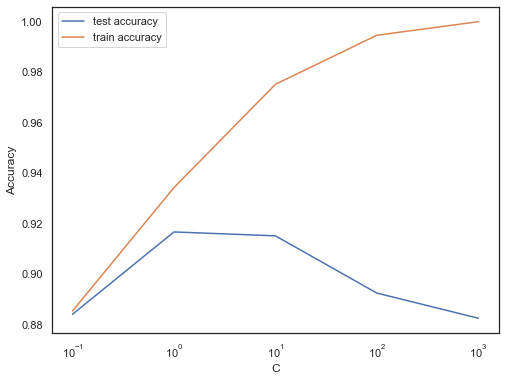

In [164]:
# plot of C versus train and test scores

plt.figure(figsize=(8, 6))
plt.plot(cv_results['param_C'], cv_results['mean_test_score'])
plt.plot(cv_results['param_C'], cv_results['mean_train_score'])
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.legend(['test accuracy', 'train accuracy'], loc='upper left')
plt.xscale('log')

Though the training accuracy monotonically increases with C, the test accuracy gradually reduces. Thus, we can conclude that higher values of C tend to **overfit** the model. This is because a high C value aims to classify all training examples correctly (since C is the *cost of misclassification* - if you impose a high cost on the model, it will avoid misclassifying any points by overfitting the data).

Let's finally look at the optimal C values found by GridSearchCV.

In [165]:
best_score = model_cv.best_score_
best_C = model_cv.best_params_['C']

print(" The highest test accuracy is {0} at C = {1}".format(best_score, best_C))

 The highest test accuracy is 0.9166514494744897 at C = 1


Let's now look at the metrics corresponding to C=10

In [166]:
# model with the best value of C
model = SVC(C=best_C)

# fit
model.fit(X_train, y_train)

# predict
y_pred = model.predict(X_test)

In [167]:
# metrics
# print other metrics

# accuracy
print("accuracy", metrics.accuracy_score(y_test, y_pred))

# precision
print("precision", metrics.precision_score(y_test, y_pred))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, y_pred))


accuracy 0.91299117882919
precision 0.7058823529411765
recall 0.4489795918367347


## Optimising for Other Evaluation Metrics

In this case, we had optimised (tuned) the model based on overall accuracy, though that may not always be the best metric to optimise. For example, if you are concerned more about catching all churns (positives), you may want to maximise TPR or sensitivity/recall. If, on the other hand, you want to avoid classifying non churns as churns (so that any important customers don't get into the churn group), you would maximise the TNR or specificity.

In [168]:
# specify params
params = {"C": [0.1, 1, 10, 100, 1000]}

# specify scores/metrics in an iterable
scores = ['accuracy', 'precision', 'recall']

for score in scores:
    print("# Tuning hyper-parameters for {}".format(score))
    
    # set up GridSearch for score metric
    clf = GridSearchCV(SVC(), 
                       params, 
                       cv=folds,
                       scoring=score,
                       return_train_score=True)
    # fit
    clf.fit(X_train, y_train)

    print(" The highest {0} score is {1} at C = {2}".format(score, clf.best_score_, clf.best_params_))


# Tuning hyper-parameters for accuracy
 The highest accuracy score is 0.9166514494744897 at C = {'C': 1}
# Tuning hyper-parameters for precision
 The highest precision score is 0.7578065715379149 at C = {'C': 1}
# Tuning hyper-parameters for recall
 The highest recall score is 0.5388711794831602 at C = {'C': 10}


# Decision Tree

## Train Test Split

In [169]:
# Putting feature variable to X
X = df.drop('churn_probability',axis=1)

# Putting response variable to y
y = df['churn_probability']

df.shape

(8313, 77)

In [170]:
from sklearn.model_selection import train_test_split

In [171]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state=42)
X_train.shape, X_test.shape

((5819, 76), (2494, 76))

## Standard Scaling

In [172]:
#Scaling the dataset using Standard Scaling
cols=X_train.columns
X_train[cols]=scaler.fit_transform(X_train[cols])
X_test[cols]=scaler.transform(X_test[cols])

X_train.describe()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,loc_og_t2t_mou_6,...,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,aon,last_rech_days_left_6,last_rech_days_left_7,last_rech_days_left_8
count,5.819000e+03,5.819000e+03,5.819000e+03,5.819000e+03,5.819000e+03,5.819000e+03,5.819000e+03,5.819000e+03,5.819000e+03,5.819000e+03,...,5.819000e+03,5.819000e+03,5.819000e+03,5.819000e+03,5.819000e+03,5.819000e+03,5.819000e+03,5.819000e+03,5.819000e+03,5.819000e+03
mean,9.601168e-17,-2.109214e-17,1.031807e-16,-2.369646e-17,-2.117466e-16,-1.804327e-16,1.521620e-16,-1.226034e-16,1.603422e-16,1.212106e-16,...,-1.555247e-16,-1.007195e-16,-1.052413e-16,3.544929e-16,1.843702e-16,-8.349091e-17,2.617200e-17,5.967997e-17,-4.474090e-17,-1.446781e-16
std,1.000086e+00,1.000086e+00,1.000086e+00,1.000086e+00,1.000086e+00,1.000086e+00,1.000086e+00,1.000086e+00,1.000086e+00,1.000086e+00,...,1.000086e+00,1.000086e+00,1.000086e+00,1.000086e+00,1.000086e+00,1.000086e+00,1.000086e+00,1.000086e+00,1.000086e+00,1.000086e+00
min,-1.803798e+00,-1.898868e+00,-1.596199e+00,-6.592642e-01,-6.567310e-01,-6.701913e-01,-9.177427e-01,-8.933259e-01,-8.972127e-01,-6.515446e-01,...,-1.105285e+00,-1.043787e+00,-1.043247e+00,-7.720763e-01,-6.978752e-01,-6.678171e-01,-1.057022e+00,-1.189520e+00,-1.191147e+00,-1.292395e+00
25%,-6.966439e-01,-6.942572e-01,-7.008963e-01,-6.580079e-01,-6.567310e-01,-6.701913e-01,-7.995404e-01,-7.833057e-01,-7.877611e-01,-6.515446e-01,...,-7.015767e-01,-6.797285e-01,-6.735249e-01,-7.720763e-01,-6.978752e-01,-6.678171e-01,-7.654325e-01,-8.457668e-01,-9.879368e-01,-7.339599e-01
50%,-2.141672e-01,-2.463864e-01,-2.195243e-01,-4.004809e-01,-3.930944e-01,-4.173075e-01,-2.974807e-01,-3.146278e-01,-3.159207e-01,-4.567945e-01,...,-2.978685e-01,-3.473270e-01,-3.038033e-01,-2.993603e-01,-3.103795e-01,-3.521787e-01,-3.747706e-01,-3.301368e-01,-1.750977e-01,1.036929e-01
75%,4.408303e-01,4.436725e-01,4.470387e-01,2.316119e-01,2.436392e-01,2.868141e-01,4.571314e-01,4.280083e-01,4.320624e-01,2.216143e-01,...,6.710311e-01,6.973633e-01,8.793059e-01,1.733557e-01,2.708641e-01,1.862631e-01,5.011228e-01,8.730001e-01,6.377413e-01,6.621282e-01
max,6.546895e+00,5.912056e+00,6.529809e+00,9.602456e+00,1.062515e+01,1.129011e+01,7.999192e+00,6.149355e+00,6.922189e+00,4.900881e+00,...,2.964094e+00,3.293260e+00,3.393413e+00,3.992901e+00,4.610816e+00,4.902271e+00,3.042114e+00,2.419890e+00,2.466629e+00,3.175087e+00


# Decision Tree

Fitting the decision tree with default hyperparameters, apart from max_depth which is 3 so that we can plot and read the tree.

In [173]:
from sklearn.tree import DecisionTreeClassifier

In [174]:
dt = DecisionTreeClassifier(max_depth=3)
dt.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3)

In [175]:
# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

In [176]:
# plotting tree with max_depth=3
dot_data = StringIO()  

export_graphviz(dt, out_file=dot_data, filled=True, rounded=True,
                feature_names=X_train.columns, 
                class_names=['Not Churned', 'Churned'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
#Image(graph.create_png())

#### Evaluating model performance

In [177]:
y_train_pred = dt.predict(X_train)
y_test_pred = dt.predict(X_test)

In [178]:
from sklearn.metrics import confusion_matrix, accuracy_score

In [179]:
print(accuracy_score(y_train, y_train_pred))
confusion_matrix(y_train, y_train_pred)

0.9355559374462966


array([[5033,  139],
       [ 236,  411]], dtype=int64)

In [180]:
print(accuracy_score(y_test, y_test_pred))
confusion_matrix(y_test, y_test_pred)

0.9206094627105053


array([[2090,   75],
       [ 123,  206]], dtype=int64)

Creating helper functions to evaluate model performance and help plot the decision tree

In [181]:
def get_dt_graph(dt_classifier):
    dot_data = StringIO()
    export_graphviz(dt_classifier, out_file=dot_data, filled=True,rounded=True,
                    feature_names=X_train.columns, 
                    class_names=['Not Churned', 'Churned'])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph

In [182]:
def evaluate_model(dt_classifier):
    print("Train Accuracy :", accuracy_score(y_train, dt_classifier.predict(X_train)))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_train, dt_classifier.predict(X_train)))
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test, dt_classifier.predict(X_test)))
    print("Test Precision :", metrics.precision_score(y_test, dt_classifier.predict(X_test)))
    print("Test Recall :", metrics.recall_score(y_test, dt_classifier.predict(X_test)))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test, dt_classifier.predict(X_test)))

### Without setting any hyper-parameters

In [183]:
dt_default = DecisionTreeClassifier(random_state=42)
dt_default.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [184]:
gph = get_dt_graph(dt_default)
#Image(gph.create_png())

In [185]:
evaluate_model(dt_default)

Train Accuracy : 1.0
Train Confusion Matrix:
[[5172    0]
 [   0  647]]
--------------------------------------------------
Test Accuracy : 0.8913392141138733
Test Precision : 0.5868263473053892
Test Recall : 0.5957446808510638
Test Confusion Matrix:
[[2027  138]
 [ 133  196]]


### Controlling the depth of the tree

In [186]:
dt_depth = DecisionTreeClassifier(max_depth=3)
dt_depth.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3)

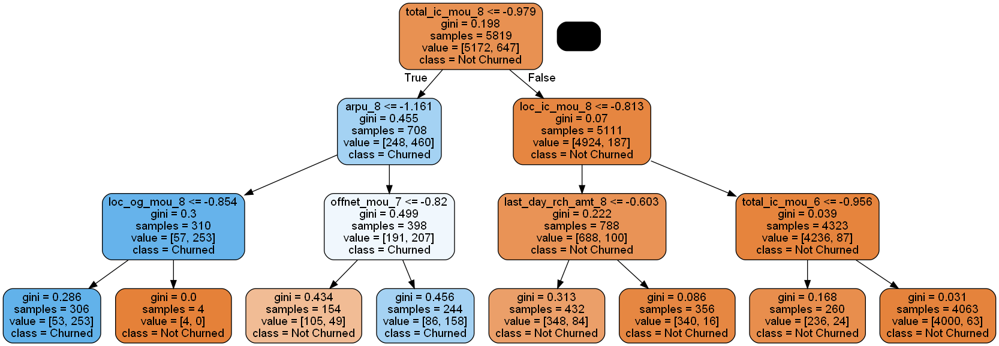

In [187]:
gph = get_dt_graph(dt_depth) 
Image(gph.create_png())

In [188]:
evaluate_model(dt_depth)

Train Accuracy : 0.9355559374462966
Train Confusion Matrix:
[[5033  139]
 [ 236  411]]
--------------------------------------------------
Test Accuracy : 0.9206094627105053
Test Precision : 0.7330960854092526
Test Recall : 0.6261398176291794
Test Confusion Matrix:
[[2090   75]
 [ 123  206]]


### Specifying minimum samples before split

In [189]:
dt_min_split = DecisionTreeClassifier(min_samples_split=20)
dt_min_split.fit(X_train, y_train)

DecisionTreeClassifier(min_samples_split=20)

In [190]:
gph = get_dt_graph(dt_min_split) 
#Image(gph.create_png())

In [191]:
evaluate_model(dt_min_split)

Train Accuracy : 0.9726757174772298
Train Confusion Matrix:
[[5124   48]
 [ 111  536]]
--------------------------------------------------
Test Accuracy : 0.9037690457097033
Test Precision : 0.6498316498316499
Test Recall : 0.5866261398176292
Test Confusion Matrix:
[[2061  104]
 [ 136  193]]


### Specifying minimum samples in leaf node

In [192]:
dt_min_leaf = DecisionTreeClassifier(min_samples_leaf=20, random_state=42)
dt_min_leaf.fit(X_train, y_train)

DecisionTreeClassifier(min_samples_leaf=20, random_state=42)

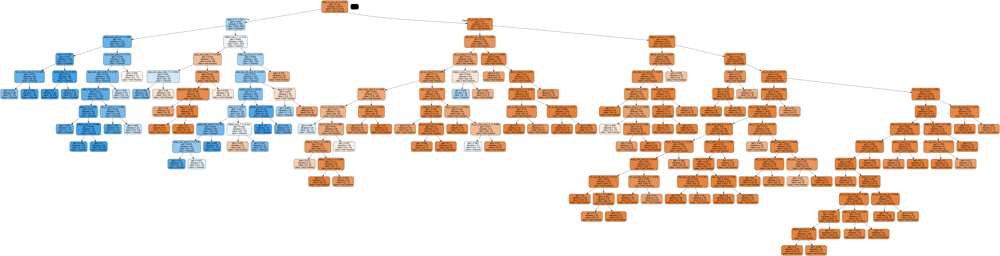

In [193]:
gph = get_dt_graph(dt_min_leaf)
Image(gph.create_png())

In [194]:
evaluate_model(dt_min_leaf)

Train Accuracy : 0.9444921807870769
Train Confusion Matrix:
[[5061  111]
 [ 212  435]]
--------------------------------------------------
Test Accuracy : 0.9210104250200482
Test Precision : 0.7444444444444445
Test Recall : 0.6109422492401215
Test Confusion Matrix:
[[2096   69]
 [ 128  201]]


### Using Entropy instead of Gini

In [195]:
dt_min_leaf_entropy = DecisionTreeClassifier(min_samples_leaf=20, random_state=42, criterion="entropy")
dt_min_leaf_entropy.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', min_samples_leaf=20,
                       random_state=42)

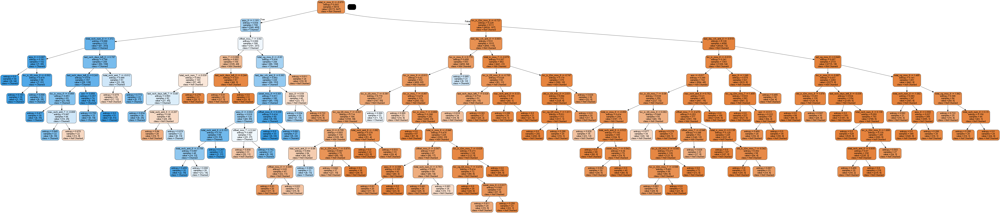

In [196]:
gph = get_dt_graph(dt_min_leaf_entropy)
Image(gph.create_png())

In [197]:
evaluate_model(dt_min_leaf_entropy)

Train Accuracy : 0.947069943289225
Train Confusion Matrix:
[[5067  105]
 [ 203  444]]
--------------------------------------------------
Test Accuracy : 0.9182036888532478
Test Precision : 0.7306273062730627
Test Recall : 0.601823708206687
Test Confusion Matrix:
[[2092   73]
 [ 131  198]]


### Hyper-parameter tuning

In [198]:
dt = DecisionTreeClassifier(random_state=42)

In [199]:
from sklearn.model_selection import GridSearchCV

In [200]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [2, 3, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion': ["gini", "entropy"]
}

In [201]:
# Instantiate the grid search model
grid_search = GridSearchCV(estimator=dt, 
                           param_grid=params, 
                           cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

In [202]:
%%time
grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 50 candidates, totalling 200 fits
Wall time: 10 s


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100]},
             scoring='accuracy', verbose=1)

In [203]:
score_df = pd.DataFrame(grid_search.cv_results_)
score_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,0.079402,0.007180,0.005777,0.001308,gini,2,5,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.924399,0.925773,0.925773,0.924347,0.925073,0.000701,38
1,0.081846,0.010531,0.004289,0.001303,gini,2,10,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.924399,0.925773,0.925773,0.924347,0.925073,0.000701,38
2,0.079498,0.006451,0.004508,0.002883,gini,2,20,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.924399,0.925773,0.925773,0.924347,0.925073,0.000701,38
3,0.077217,0.009494,0.004256,0.001286,gini,2,50,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.924399,0.925773,0.925773,0.924347,0.925073,0.000701,38
4,0.079455,0.004711,0.005016,0.000033,gini,2,100,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.924399,0.925773,0.927835,0.924347,0.925588,0.001418,36


In [204]:
score_df.nlargest(5,"mean_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
7,0.116482,0.008188,0.005006,0.000024,gini,3,20,"{'criterion': 'gini', 'max_depth': 3, 'min_sam...",0.932646,0.929897,0.931959,0.937414,0.932979,0.002753,1
9,0.109478,0.004648,0.002536,0.002536,gini,3,100,"{'criterion': 'gini', 'max_depth': 3, 'min_sam...",0.932646,0.929897,0.927835,0.937414,0.931948,0.003588,2
14,0.163944,0.012450,0.005267,0.002844,gini,5,100,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.932646,0.929897,0.927835,0.937414,0.931948,0.003588,2
19,0.210313,0.027194,0.005264,0.001782,gini,10,100,"{'criterion': 'gini', 'max_depth': 10, 'min_sa...",0.932646,0.929897,0.927835,0.937414,0.931948,0.003588,2
24,0.277913,0.028667,0.001249,0.002164,gini,20,100,"{'criterion': 'gini', 'max_depth': 20, 'min_sa...",0.932646,0.929897,0.927835,0.937414,0.931948,0.003588,2


In [205]:
grid_search.best_estimator_

DecisionTreeClassifier(max_depth=3, min_samples_leaf=20, random_state=42)

In [206]:
dt_best = grid_search.best_estimator_

In [207]:
evaluate_model(dt_best)

Train Accuracy : 0.9348685341123905
Train Confusion Matrix:
[[5029  143]
 [ 236  411]]
--------------------------------------------------
Test Accuracy : 0.9206094627105053
Test Precision : 0.7330960854092526
Test Recall : 0.6261398176291794
Test Confusion Matrix:
[[2090   75]
 [ 123  206]]


In [208]:
from sklearn.metrics import classification_report

In [209]:
print(classification_report(y_test, dt_best.predict(X_test)))

              precision    recall  f1-score   support

           0       0.94      0.97      0.95      2165
           1       0.73      0.63      0.68       329

    accuracy                           0.92      2494
   macro avg       0.84      0.80      0.82      2494
weighted avg       0.92      0.92      0.92      2494



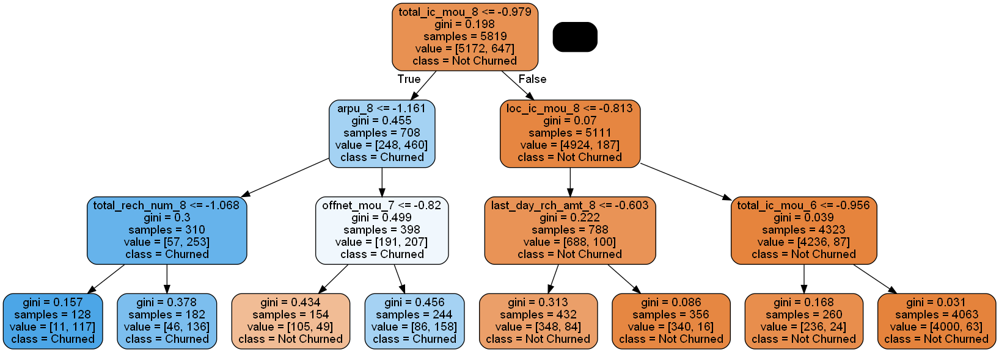

In [210]:
gph = get_dt_graph(dt_best)
Image(gph.create_png())

## Random Forest

In [211]:
from sklearn.ensemble import RandomForestClassifier

In [212]:
rf = RandomForestClassifier(random_state=42, n_estimators=10, max_depth=3)

In [213]:
rf.fit(X_train, y_train)

RandomForestClassifier(max_depth=3, n_estimators=10, random_state=42)

In [214]:
rf.estimators_[0]

DecisionTreeClassifier(max_depth=3, max_features='auto',
                       random_state=1608637542)

In [215]:
sample_tree = rf.estimators_[4]

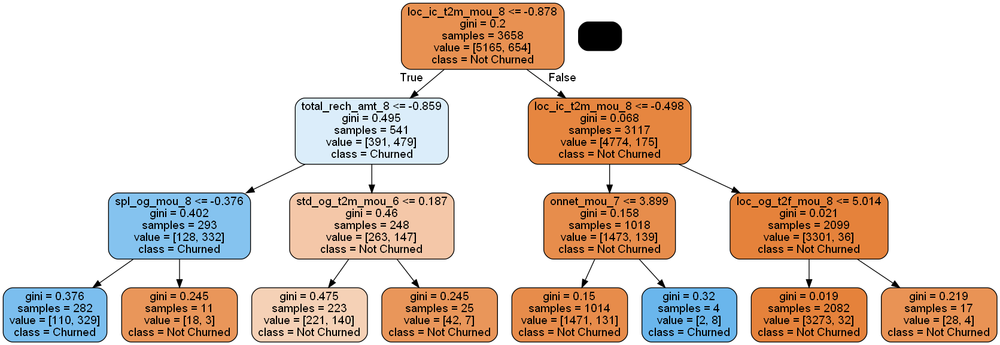

In [216]:
gph = get_dt_graph(sample_tree)
Image(gph.create_png(), width=700, height=700)

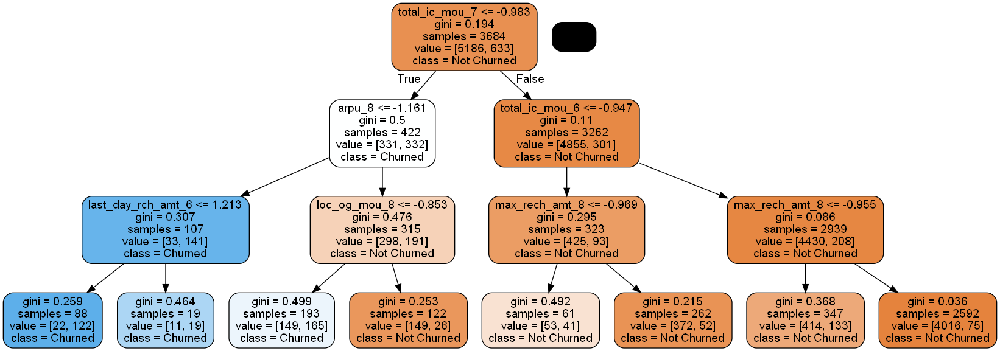

In [217]:
gph = get_dt_graph(rf.estimators_[2])
Image(gph.create_png(), width=700, height=700)

In [218]:
evaluate_model(rf)

Train Accuracy : 0.9367588932806324
Train Confusion Matrix:
[[5040  132]
 [ 236  411]]
--------------------------------------------------
Test Accuracy : 0.9270248596631917
Test Precision : 0.7578947368421053
Test Recall : 0.6565349544072948
Test Confusion Matrix:
[[2096   69]
 [ 113  216]]


#### Grid search for hyper-parameter tuning

In [219]:
classifier_rf = RandomForestClassifier(random_state=42, n_jobs=-1)

In [220]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [1, 2, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'max_features': [2,3,4],
    'n_estimators': [10, 30, 50, 100, 200]
}

In [221]:
# Instantiate the grid search model
grid_search = GridSearchCV(estimator=classifier_rf, param_grid=params, 
                          cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

In [222]:
%%time
grid_search.fit(X_train,y_train)

Fitting 4 folds for each of 375 candidates, totalling 1500 fits
Wall time: 2min 32s


GridSearchCV(cv=4, estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [1, 2, 5, 10, 20],
                         'max_features': [2, 3, 4],
                         'min_samples_leaf': [5, 10, 20, 50, 100],
                         'n_estimators': [10, 30, 50, 100, 200]},
             scoring='accuracy', verbose=1)

In [223]:
rf_best = grid_search.best_estimator_

In [224]:
rf_best

RandomForestClassifier(max_depth=10, max_features=3, min_samples_leaf=10,
                       n_estimators=10, n_jobs=-1, random_state=42)

In [225]:
evaluate_model(rf_best)

Train Accuracy : 0.9448358824540299
Train Confusion Matrix:
[[5065  107]
 [ 214  433]]
--------------------------------------------------
Test Accuracy : 0.9302325581395349
Test Precision : 0.773851590106007
Test Recall : 0.6656534954407295
Test Confusion Matrix:
[[2101   64]
 [ 110  219]]


In [226]:
sample_tree = rf_best.estimators_[0]

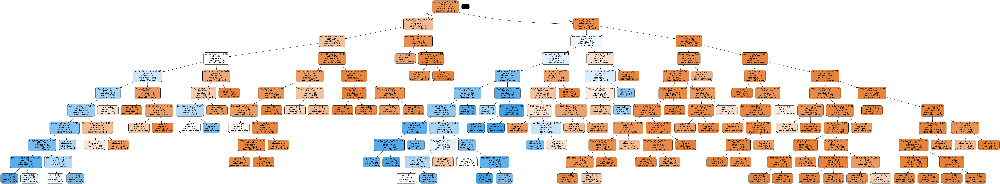

In [227]:
gph = get_dt_graph(sample_tree)
Image(gph.create_png())

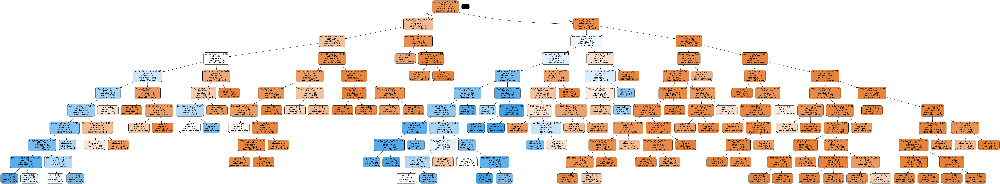

In [228]:
gph = get_dt_graph(rf_best.estimators_[0])
Image(gph.create_png(), height=3000, width=1500)

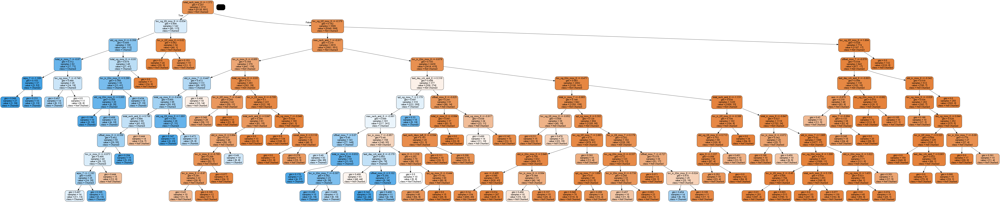

In [229]:
gph = get_dt_graph(rf_best.estimators_[9])
Image(gph.create_png(), height=600, width=600)

### Variable importance in RandomForest and Decision trees

In [230]:
classifier_rf = RandomForestClassifier(random_state=42, n_jobs=-1, max_depth=5, n_estimators=100, oob_score=True)

In [231]:
classifier_rf.fit(X_train, y_train)

RandomForestClassifier(max_depth=5, n_jobs=-1, oob_score=True, random_state=42)

In [232]:
classifier_rf.feature_importances_

array([0.00360505, 0.00305326, 0.05659446, 0.00787137, 0.0073883 ,
       0.00928025, 0.0072175 , 0.00788425, 0.01374916, 0.0011047 ,
       0.00512457, 0.02277291, 0.00344593, 0.008104  , 0.02372447,
       0.00077504, 0.00107847, 0.00068226, 0.00459681, 0.00479211,
       0.04506754, 0.00022217, 0.00050912, 0.00046914, 0.00108615,
       0.00111945, 0.00159757, 0.0005834 , 0.00195932, 0.00183299,
       0.00132278, 0.00123063, 0.00290761, 0.00217847, 0.00867242,
       0.04016741, 0.00140146, 0.0069786 , 0.028997  , 0.01216066,
       0.02304595, 0.13357619, 0.00109823, 0.00208146, 0.00124458,
       0.01172088, 0.01681855, 0.12656041, 0.00099898, 0.00073332,
       0.00041608, 0.00072293, 0.00053038, 0.00254298, 0.00071092,
       0.00066374, 0.00701484, 0.01876243, 0.03929216, 0.14383593,
       0.00112838, 0.00200038, 0.01093812, 0.00216593, 0.00272701,
       0.03415527, 0.00283836, 0.00555562, 0.03028422, 0.00074443,
       0.00262993, 0.01127903, 0.00261199, 0.00164496, 0.00140

In [233]:
imp_df = pd.DataFrame({
    "Varname": X_train.columns,
    "Imp": classifier_rf.feature_importances_
})

In [266]:
imp_df.sort_values(by="Imp", ascending=False)

,Varname,Imp
59,total_ic_mou_8,0.143836
41,loc_ic_t2m_mou_8,0.133576
47,loc_ic_mou_8,0.126560
2,arpu_8,0.056594
20,loc_og_mou_8,0.045068
...,...,...
52,std_ic_t2m_mou_7,0.000530
22,std_og_t2t_mou_7,0.000509
23,std_og_t2t_mou_8,0.000469
50,std_ic_t2t_mou_8,0.000416


## Xgboost Classifier



In [235]:
import xgboost as xgb
xgb_cfl = xgb.XGBClassifier(n_jobs = -1,objective = 'binary:logistic')
xgb_cfl.get_params()

{'objective': 'binary:logistic',
 'use_label_encoder': True,
 'base_score': None,
 'booster': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'enable_categorical': False,
 'gamma': None,
 'gpu_id': None,
 'importance_type': None,
 'interaction_constraints': None,
 'learning_rate': None,
 'max_delta_step': None,
 'max_depth': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'n_estimators': 100,
 'n_jobs': -1,
 'num_parallel_tree': None,
 'predictor': None,
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None}

In [236]:
# Fit the model to our train and target
xgb_cfl.fit(X_train, y_train)  # default 
# Get our predictions
xgb_predictions = xgb_cfl.predict(X_test)

[16:16:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [237]:
xgb_predictions_prob = xgb_cfl.predict_proba(X_test)
xgb_predictions_prob

array([[9.9920166e-01, 7.9831528e-04],
       [9.9990147e-01, 9.8513279e-05],
       [9.9948430e-01, 5.1570201e-04],
       ...,
       [9.9964422e-01, 3.5579121e-04],
       [9.9978971e-01, 2.1031097e-04],
       [9.9995017e-01, 4.9852260e-05]], dtype=float32)

In [238]:
print("Test Accuracy :", accuracy_score(y_test, xgb_predictions))
print("Test Precision :", metrics.precision_score(y_test, xgb_predictions))
print("Test Recall :", metrics.recall_score(y_test, xgb_predictions))

Test Accuracy : 0.9198075380914194
Test Precision : 0.7397769516728625
Test Recall : 0.6048632218844985


# HPT - Random Search

In [261]:
from sklearn.model_selection import RandomizedSearchCV
# A parameter grid for XGBoost
params = {
        'n_estimators' : [100, 200, 500, 750], # no of trees 
        'learning_rate' : [0.01, 0.02, 0.05, 0.1, 0.25],  # eta
        'min_child_weight': [1, 5, 7, 10],
        'gamma': [0.1, 0.5, 1, 1.5, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5, 10, 12]
        }

folds = 5

param_comb = 60

random_search = RandomizedSearchCV(xgb_cfl, param_distributions=params, n_iter=param_comb, scoring='accuracy', n_jobs=-1, cv=5, verbose=3, random_state=42)


In [262]:
%%time
random_search.fit(X_train, y_train)

Fitting 5 folds for each of 60 candidates, totalling 300 fits
[16:53:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Wall time: 16min 41s


RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                           colsample_bylevel=1,
                                           colsample_bynode=1,
                                           colsample_bytree=1,
                                           enable_categorical=False, gamma=0,
                                           gpu_id=-1, importance_type=None,
                                           interaction_constraints='',
                                           learning_rate=0.300000012,
                                           max_delta_step=0, max_depth=6,
                                           min_child_weight=1, missing=nan,
                                           monotone_constraints='()',
                                           n_estimat...
                                           tree_method='exact',
                                           validate_parameters=1,
       

In [263]:
print('\n Best estimator:')
print(random_search.best_estimator_)
print('\n Best accuracy for %d-fold search with %d parameter combinations:' % (folds, param_comb))
print(random_search.best_score_ )
print('\n Best hyperparameters:')
print(random_search.best_params_)


 Best estimator:
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.6,
              enable_categorical=False, gamma=0.1, gpu_id=-1,
              importance_type=None, interaction_constraints='',
              learning_rate=0.01, max_delta_step=0, max_depth=10,
              min_child_weight=5, missing=nan, monotone_constraints='()',
              n_estimators=200, n_jobs=-1, num_parallel_tree=1,
              predictor='auto', random_state=0, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=1.0, tree_method='exact',
              validate_parameters=1, verbosity=None)

 Best accuracy for 5-fold search with 60 parameter combinations:
0.7665905515110447

 Best hyperparameters:
{'subsample': 1.0, 'n_estimators': 200, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.01, 'gamma': 0.1, 'colsample_bytree': 0.6}


In [264]:
xgb_predictions_hpt = random_search.predict(X_test)

print("Test Accuracy :", accuracy_score(y_test, xgb_predictions_hpt))
print("Test Precision :", metrics.precision_score(y_test, xgb_predictions_hpt))
print("Test Recall :", metrics.recall_score(y_test, xgb_predictions_hpt))

Test Accuracy : 0.9242181234963913
Test Precision : 0.7631578947368421
Test Recall : 0.6170212765957447


#### Score here shows that HPT helped improving the Model accuracy

### Feature Importance Xgboost Model


In [260]:
xgb_cfl.feature_importances_

array([0.00892181, 0.00734139, 0.01459548, 0.00616763, 0.00706887,
       0.00988448, 0.00634252, 0.01421023, 0.01024506, 0.00640233,
       0.00600815, 0.00560844, 0.0101716 , 0.0067157 , 0.00752449,
       0.0095187 , 0.00879938, 0.00818543, 0.00811633, 0.00360814,
       0.01190243, 0.00504795, 0.01121491, 0.00342936, 0.00531906,
       0.00415708, 0.00793361, 0.01276443, 0.00363855, 0.00908715,
       0.0112849 , 0.00887333, 0.00913506, 0.00903559, 0.00608839,
       0.01530365, 0.01008545, 0.00794013, 0.00941075, 0.00909193,
       0.00730745, 0.03372463, 0.00813904, 0.00779811, 0.01152162,
       0.01384976, 0.01476812, 0.06071089, 0.01481131, 0.01610837,
       0.01059415, 0.00888443, 0.00819977, 0.01058788, 0.00631973,
       0.00722444, 0.01300502, 0.01371338, 0.01080819, 0.23331095,
       0.00691285, 0.00847729, 0.00700573, 0.00624028, 0.00956182,
       0.01378016, 0.01071176, 0.01185707, 0.00884779, 0.01076626,
       0.00604744, 0.02302841, 0.00828606, 0.00571003, 0.00571

In [244]:
# Scatter plot 
trace = go.Scatter(
    y = xgb_cfl.feature_importances_,
    x = df.columns.values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1.3,
        size = 12,
        color = xgb_cfl.feature_importances_,
        colorscale='Portland',
        showscale=True
    ),
    text = df.columns.values
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'XGBOOST Model Feature Importance',
    hovermode= 'closest',
     xaxis= dict(
         ticklen= 5,
         showgrid=False,
        zeroline=False,
        showline=False
     ),
    yaxis=dict(
        title= 'Feature Importance',
        showgrid=False,
        zeroline=False,
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter')

Model considered:

Random Forest Classifier model with hyper tuning
- features of selected model:
     
     max_depth=10, max_features=3, min_samples_leaf=10, n_estimators=10



Train Accuracy : 0.9448358824540299


Train Confusion Matrix:


[[5065  107]
 [ 214  433]]

-------
Test Accuracy : 0.9302325581395349

Test Precision : 0.773851590106007

Test Recall : 0.6656534954407295

Test Confusion Matrix:


[[2101   64]
 [ 110  219]]
 
The reason behind choosing this model is highest accuracy, precision and recall.

--------------

Here are top 5 most important features:

total_ic_mou_8 =>	0.143836

loc_ic_t2m_mou_8 =>	0.133576

loc_ic_mou_8 =>	0.126560

arpu_8 =>	0.056594

loc_og_mou_8 =>	0.045068

# Test.csv

In [276]:
test_df=pd.read_csv("test (1).csv")

In [277]:
#Fill dates in date column
test_df.loc[test_df['last_date_of_month_6'].isna(),'last_date_of_month_6']=test_df.last_date_of_month_6.mode()
test_df.loc[test_df['last_date_of_month_7'].isna(),'last_date_of_month_7']=test_df.last_date_of_month_6.mode()
test_df.loc[test_df['last_date_of_month_8'].isna(),'last_date_of_month_8']=test_df.last_date_of_month_6.mode()

test_df.loc[test_df['date_of_last_rech_6'].isna(),'date_of_last_rech_6']=test_df.last_date_of_month_6.mode()
test_df.loc[test_df['date_of_last_rech_7'].isna(),'date_of_last_rech_7']=test_df.last_date_of_month_7.mode()
test_df.loc[test_df['date_of_last_rech_8'].isna(),'date_of_last_rech_8']=test_df.last_date_of_month_8.mode()

In [278]:
#Derive data from date columns
test_df['last_rech_days_left_6']=(pd.to_datetime(test_df.last_date_of_month_6)-pd.to_datetime(test_df.date_of_last_rech_6)).dt.days
test_df['last_rech_days_left_7']=(pd.to_datetime(test_df.last_date_of_month_7)-pd.to_datetime(test_df.date_of_last_rech_7)).dt.days
test_df['last_rech_days_left_8']=(pd.to_datetime(test_df.last_date_of_month_8)-pd.to_datetime(test_df.date_of_last_rech_8)).dt.days

In [279]:
test_df.drop(test_df.select_dtypes(exclude=[np.float64,np.number]).columns, axis=1, inplace=True)
test_df=test_df.fillna(0)
print(test_df.isna().sum())

id                       0
circle_id                0
loc_og_t2o_mou           0
std_og_t2o_mou           0
loc_ic_t2o_mou           0
                        ..
jul_vbc_3g               0
jun_vbc_3g               0
last_rech_days_left_6    0
last_rech_days_left_7    0
last_rech_days_left_8    0
Length: 165, dtype: int64


In [280]:
df.columns.shape

(77,)

In [281]:
idcol=test_df['id']
for col in test_df.columns:
    if (col not in df.columns):
        test_df.drop(col, axis=1, inplace=True)

print(test_df.columns)
print(test_df.shape)

Index(['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7',
       'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8',
       'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8',
       'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8',
       'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8',
       'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6',
       'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6',
       'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_mou_6', 'std_og_mou_7',
       'std_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8',
       'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8',
       'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8',
       'loc_ic_t2m_mou_6', 'loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8',
       'loc_ic_t2f_mou_6', 'loc_ic_t2f_mou_7', 'loc_ic_t2f_mou_8',
       'loc_ic_mou_6', 'loc_ic_mou_7', 'loc_ic_mou_8', 'std_ic_t2t_mou_6',
       'std_ic_t2t_mou_7', 'std_i

In [282]:
test_df[cols]=scaler.transform(test_df[cols])
test_df.describe()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,loc_og_t2t_mou_6,...,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,aon,last_rech_days_left_6,last_rech_days_left_7,last_rech_days_left_8
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000
mean,1.620063,1.681186,1.533492,4.597616,5.302898,5.315167,2.553914,2.862142,2.693191,2.021412,...,0.587006,0.637008,0.556414,0.410180,0.456852,0.501844,0.111613,-0.185818,-0.074245,0.195239
std,3.169129,3.326384,3.156991,11.979266,13.883502,14.048549,5.776101,6.538886,6.341507,8.650416,...,1.917554,2.102609,1.960504,1.814189,1.880147,2.040600,1.080918,1.056547,1.175607,1.694280
min,-3.091790,-21.922163,-2.593188,-0.659264,-0.656731,-0.670191,-0.917743,-0.893326,-0.897213,-0.651545,...,-1.105285,-1.043787,-1.043247,-0.772076,-0.697875,-0.667817,-1.057022,-1.189520,-1.191147,-1.292395
25%,-0.291496,-0.293310,-0.358792,-0.432724,-0.433618,-0.477433,-0.389846,-0.365467,-0.432624,-0.597155,...,-0.620835,-0.568928,-0.599581,-0.772076,-0.697875,-0.667817,-0.735035,-1.017644,-0.987937,-1.013178
50%,0.769581,0.779825,0.680943,0.655589,0.713155,0.686142,0.729892,0.793220,0.717197,-0.025186,...,0.671031,0.697363,0.406062,-0.204817,-0.116632,-0.110808,-0.299340,-0.673890,-0.378308,-0.454742
75%,2.519993,2.565213,2.384154,4.010455,4.413150,4.475112,3.145056,3.414738,3.236129,1.644518,...,0.832514,0.982279,1.086350,1.307874,1.433351,1.745888,0.761189,0.357370,0.434532,0.662128
max,109.142492,134.906871,129.444331,290.131063,344.539985,319.543967,127.572267,191.088482,261.087165,343.145571,...,49.761946,62.429064,64.752413,57.844708,76.995017,81.936585,3.465425,3.794904,4.905147,7.084133


In [283]:
churn_prob=rf_best.predict(test_df)

with open("submission.csv","w") as o:
    print("id,churn_probability",file=o)
    for i in range(0,len(idcol)):
        s= "{0},{1}".format(idcol[i],churn_prob[i])
        print(s,file=o)
    o.close()

In [284]:
import numpy
u, c=numpy.unique(churn_prob,return_counts=True)
dict(zip(u,c))

{0: 27683, 1: 2317}